In [ ]:
import torch
import gc

def clear_gpu_memory():
    # Opróżnienie pamięci GPU z nieużywanych tensorów
    torch.cuda.empty_cache()
    
    # Zwolnienie pamięci w Pythonie
    gc.collect()

    # Informacja o aktualnym wykorzystaniu pamięci GPU
    print(f"Memory Allocated: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
    print(f"Memory Cached: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")

# Wywołanie funkcji
clear_gpu_memory()

Memory Allocated: 0.00 MB
Memory Cached: 0.00 MB


In [2]:
import numpy as np
import os
import librosa
import matplotlib.pyplot as plt
import random
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torch.nn.init as init
from torch.nn import init
from torch.optim import lr_scheduler

from torchvision import models
from torchvision import transforms
from torchvision.transforms import Resize

from torchsummary import summary

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split

In [ ]:
path_data = 'C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/'
genre = 'metal/'
filename = 'metal.00069.wav'

# Połączenie folderu, gatunku i nazwy pliku w jedną ścieżkę
audio_path = os.path.join(path_data, genre, filename)

In [ ]:
# Odczyt pliku WAV, sygnał zapisany w tablicy 'y', częstotliwość próbkowania w 'sr'
y, sr = librosa.load(audio_path, sr=22050)

<b>Wykres fali dźwiękowej (waveform)</b> pokazuje zmiany głośności dźwięku w czasie. Oś X przedstawia czas (sekundy), a oś Y przedstawia amplitudę (głośność). Gdy linia jest wysoko, dźwięk jest głośny, a gdy jest nisko, dźwięk jest cichy. Dzięki temu wykresowi możemy zobaczyć, jak zmienia się dźwięk, jakie momenty są głośniejsze, a które cichsze, oraz jak dźwięk rozwija się w czasie.

- Oś Y (pionowa) przedstawia amplitudę dźwięku, czyli jego głośność.
- Oś X (pozioma) na wykresie przedstawia przedstawia momenty w czasie w sekundach (s), kiedy te zmiany amplitudy zachodzą.

- Kiedy linia wykresu jest wysoko na górze, oznacza to, że dźwięk jest głośny (i ma <i>dodatnią amplitudę</i>).
- Kiedy linia wykresu jest na dole, oznacza to, że dźwięk jest również głośny, ale ma <i>negatywną amplitudę</i>.
- Kiedy linia jest blisko osi X, oznacza to, że dźwięk jest bardzo cichy (lub prawie w ciszy) w danym momencie.

<i>Dodatnia amplituda</i> jest wtedy, gdy fala dźwiękowa idzie do góry. W praktyce, w kontekście dźwięku, oznacza to, że cząsteczki powietrza są skompresowane, czyli ciśnienie powietrza w danym momencie jest wyższe niż normalnie. Takie wibracje cząsteczek powietrza są odbierane jako dźwięk. Dźwięk staje się głośniejszy w jednym kierunku (np. ciśnienie powietrza rośnie).

<i> Negatywna amplituda</i> jest wtedy, gdy fala dźwiękowa idzie w dół. W tym przypadku cząsteczki powietrza są rozciągane, czyli ciśnienie powietrza w tym momencie jest niższe niż normalnie. To również powoduje, że dźwięk jest odczuwany przez nasze uszy.  Dźwięk staje się głośniejszy w przeciwnym kierunku (np. ciśnienie powietrza spada).

Dzięki tym dwóm kierunkom (górze i dołowi) dźwięk może przechodzić przez nasz układ słuchowy w sposób ciągły i wytwarzać różne dźwięki.


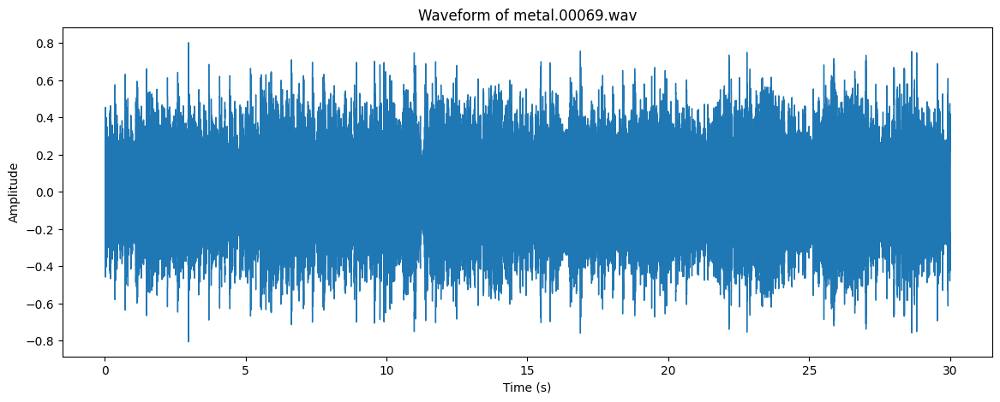

In [ ]:
# Wizualizacja przebiegu czasowego
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title(f'Waveform of {filename}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

Po uruchomieniu tego kodu można zobaczyć kilka wykresów falowych (każdy dla 4-sekundowego kawałka dźwięku), gdzie każdy kolejny kawałek nakłada się na poprzedni o 2 sekundy. Taki sposób prezentacji jest pomocny w analizie dźwięku, np. w klasyfikacji muzyki czy rozpoznawaniu mowy.

In [6]:
y.shape

(661504,)

In [7]:
from IPython.display import Audio
Audio(data=y,rate=sr)

In [8]:
y

array([0.19439697, 0.16574097, 0.10437012, ..., 0.12704468, 0.11346436,
       0.09072876], dtype=float32)

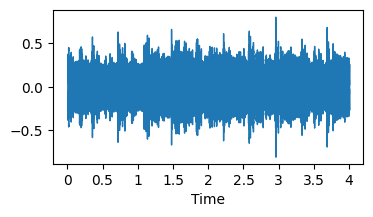

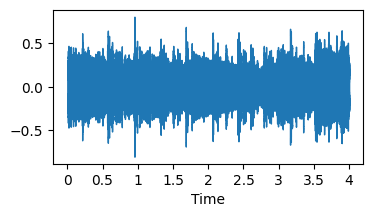

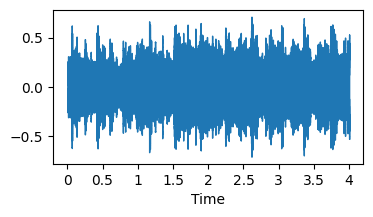

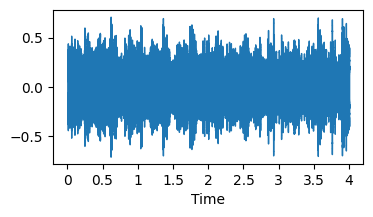

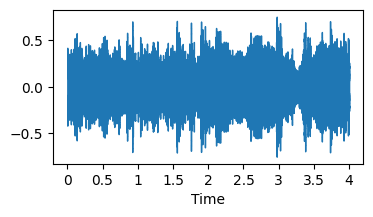

...

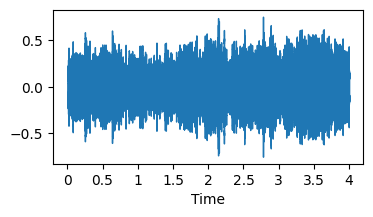

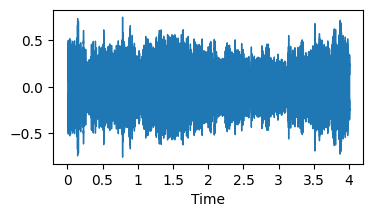

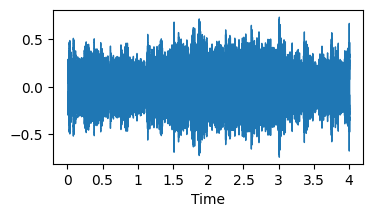

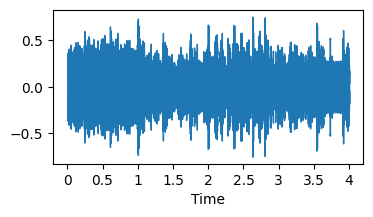

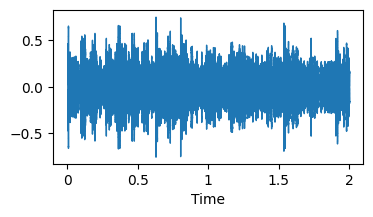

In [ ]:
# Wczytanie pliku audio w oryginalnej częstotliwości próbkowania
y, sr = librosa.load(audio_path, sr=None)

# Parametry podziału sygnału
chunk_duration = 4      # długość fragmentu w sekundach
overlap_duration = 2    # nakładanie fragmentów w sekundach

# Przeliczamy czasy trwania na liczbę próbek

# Przeliczenie parametrów na liczbę próbek
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr

# Wyznaczenie liczby fragmentów
num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

# Wycinanie i wizualizacja kolejnych fragmentów
for i in range(num_chunks):
    start = i * (chunk_samples - overlap_samples)
    end = start + chunk_samples
    chunk = y[start:end]  # Wydobywamy fragment dźwięku

    plt.figure(figsize=(4, 2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show()

In [ ]:
# Dodanie szumu gaussowskiego do sygnału
def add_noise(audio, noise_level=0.005):
    noise = np.random.randn(len(audio))
    audio = audio + noise_level * noise
    return audio

# Przesunięcie sygnału w czasie
def time_shift(audio, shift_max=0.5):
    shift = np.random.randint(0, int(shift_max * len(audio)))
    return np.roll(audio, shift)

# Losowe przycięcie sygnału do fragmentu crop_size (w sekundach)
def random_crop(audio, sr, crop_size=4):
    max_offset = len(audio) - crop_size * sr
    offset = np.random.randint(0, max_offset)
    return audio[offset:offset + crop_size * sr]

# Kolejne transformacje: przesunięcie, szum i przycięcie
def apply_transforms(audio, sr):
    audio = time_shift(audio)
    audio = add_noise(audio)
    audio = random_crop(audio, sr)
    return audio

<b>Spektrogram</b> to graficzna reprezentacja rozkładu częstotliwości w czasie. Mówiąc prościej, spektrogram pokazuje, jakie dźwięki (częstotliwości) występują w nagraniu i jak te dźwięki zmieniają się w czasie.

<b>Mel-spektrogram</b> to specjalny rodzaj spektrogramu, w którym częstotliwości są przekształcone na skalę mel. Skala ta lepiej odwzorowuje to, jak słyszymy dźwięki – dla ludzkiego ucha różnice w wyższych częstotliwościach są mniej zauważalne niż w niższych, dlatego skala mel ma nieliniowy rozkład częstotliwości.

Wartości w spektrogramie:
- Oś X przedstawia czas (w sekundach), czyli kiedy dana częstotliwość była obecna w dźwięku.
- Oś Y przedstawia częstotliwość (w pasmach mel), czyli jakie dźwięki (wysokie/niski ton) były obecne w dźwięku.
- Kolory na wykresie pokazują intensywność dźwięku (w dB) w danej częstotliwości i czasie – ciemniejsze kolory oznaczają głośniejsze dźwięki.

In [ ]:
# Przeskalowanie spektrogramów do rozmiaru 216x144 (używane później w modelu)
resize_transform = Resize((216, 144))  

# Funkcja wyliczająca mel-spektrogram i konwertująca go do skali dB
def calc_mel_spec(audio, sr, n_mfccs=128, n_fft=2048, hop_length=64):
    mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=n_mfccs, n_fft=n_fft, hop_length=hop_length)
    mel_spec_db = librosa.amplitude_to_db(mel_spec, ref=np.max)
    return mel_spec_db

In [ ]:
# Normalizacja mel-spektrogramu do zakresu [0, 1]
def min_max_normalize(mel_spec_db):
    min_val = np.min(mel_spec_db)
    max_val = np.max(mel_spec_db)
    if max_val > min_val:  
        return (mel_spec_db - min_val) / (max_val - min_val)
    else:
        return mel_spec_db

In [ ]:
# Rysowanie mel-spektrogramu w postaci mapy kolorów
def plot_melspectrogram(audio, sr, n_mels=128, n_fft=2048, hop_length=64, fig_size=(12, 6), cmap='magma'):
    mel_spec_db = calc_mel_spec(audio, sr, n_mfccs=n_mels, n_fft=n_fft, hop_length=hop_length)
    mel_spec_db_resized = resize_transform(torch.tensor(mel_spec_db).unsqueeze(0).float()) 
    mel_spec_db_resized_np = mel_spec_db_resized[0].numpy()
    plt.figure(figsize=fig_size)
    librosa.display.specshow(mel_spec_db_resized_np, sr=sr, x_axis='time', y_axis='mel', cmap=cmap)
    plt.title("Mel Power Spectrogram")
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

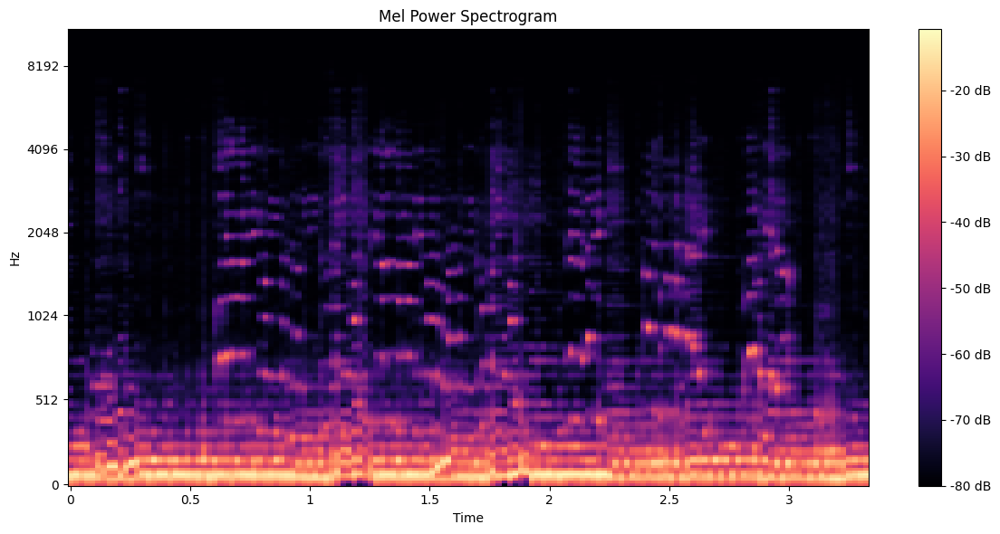

In [14]:
# Wizualizacja całego pliku audio
plot_melspectrogram(y, sr, n_mels=128, n_fft=2048, hop_length=64, fig_size=(12, 6), cmap='magma')

In [ ]:
# Podział nagrania na fragmenty i wizualizacja mel-spektrogramów dla każdego z nich
def plot_melspectrogram_chunks(y, sr, chunk_duration=4, overlap_duration=2, n_mels=128, n_fft=2048, hop_length=64, fig_size=(12, 6), cmap='magma'):
    chunk_samples = chunk_duration * sr
    overlap_samples = overlap_duration * sr
    num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

    for i in range(num_chunks):
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples
        chunk = y[start:end]
        mel_spectrogram_db = calc_mel_spec(chunk, sr, n_mfccs=n_mels, n_fft=n_fft, hop_length=hop_length)
        plt.figure(figsize=fig_size)
        librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel', cmap=cmap)
        plt.colorbar(format='%+02.0f dB')
        plt.title(f"Mel Power Spectrogram Chunk {i+1}")
        plt.tight_layout()
        plt.show()

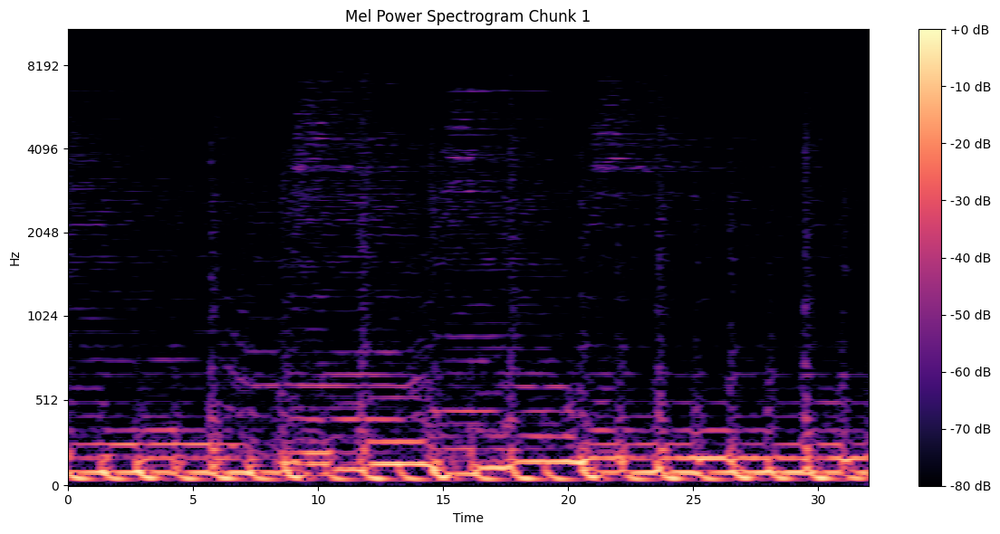

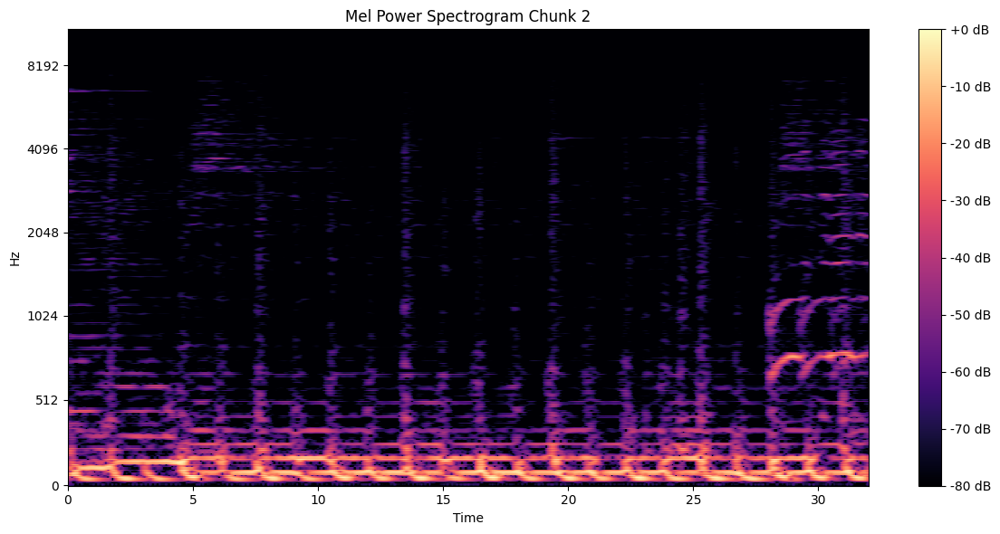

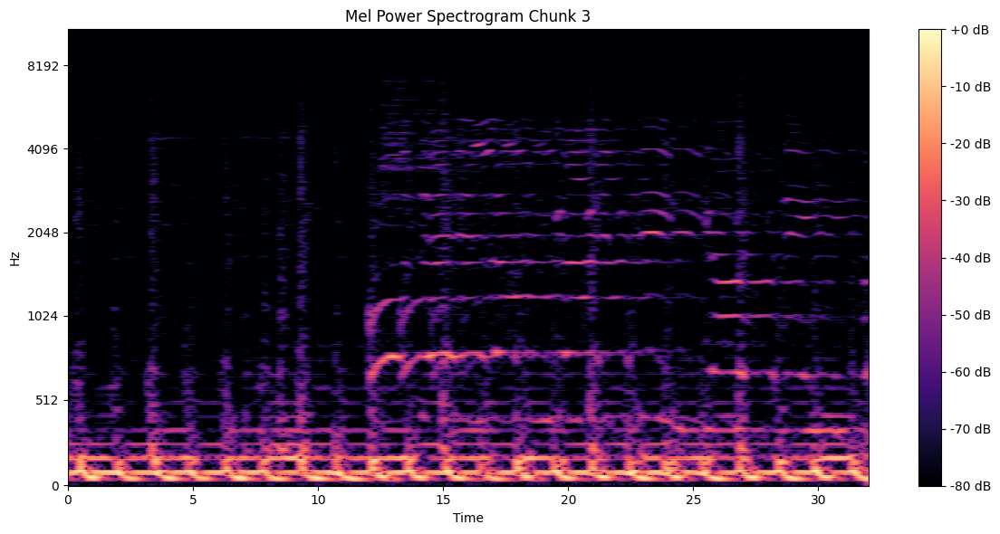

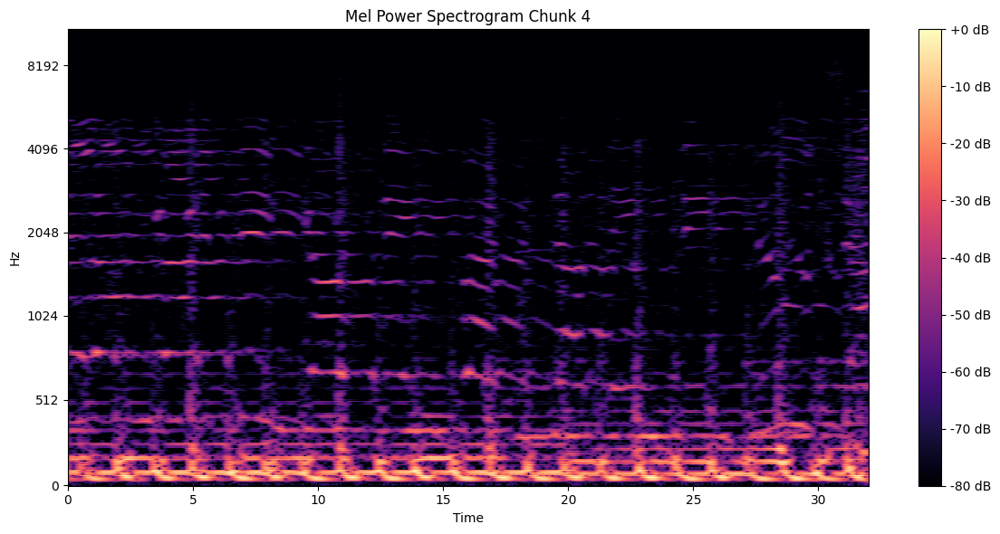

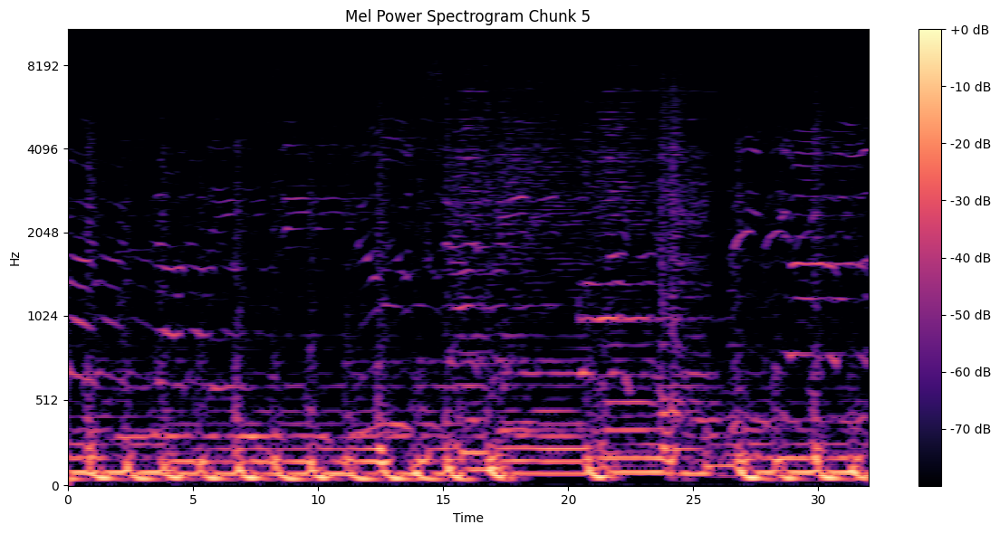

...

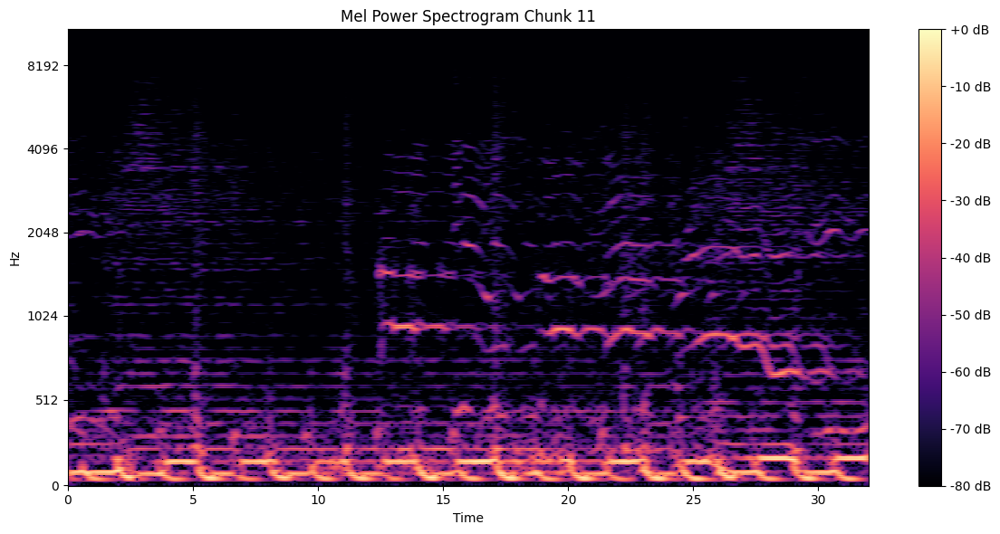

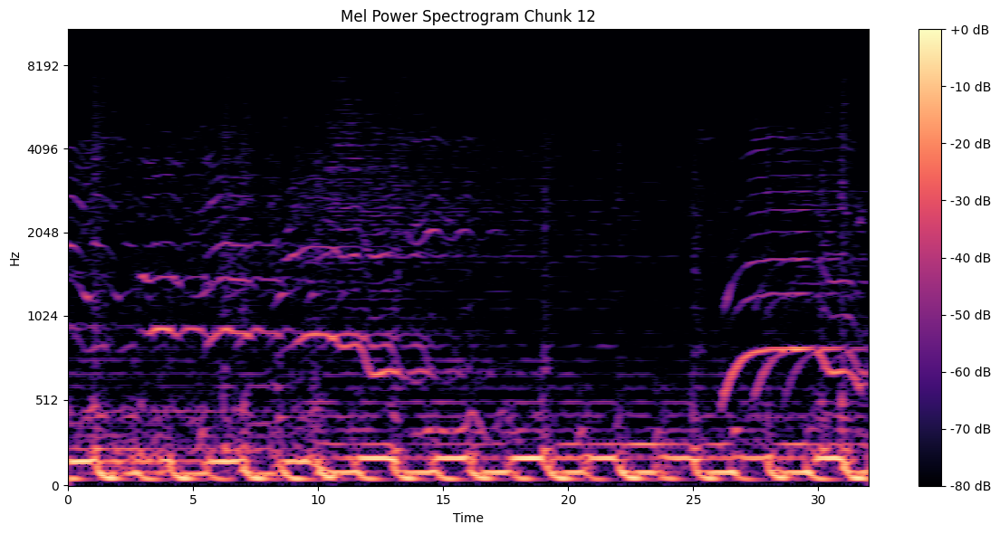

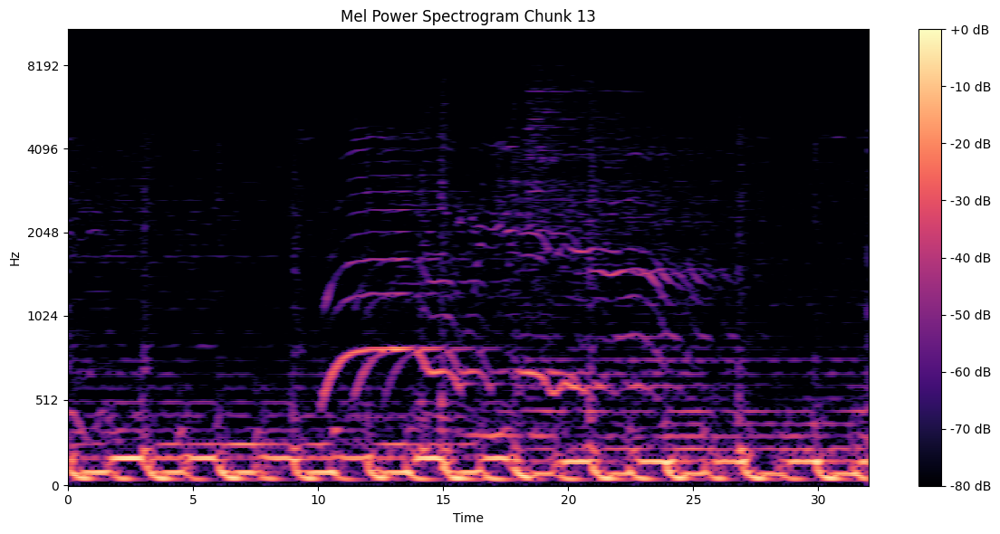

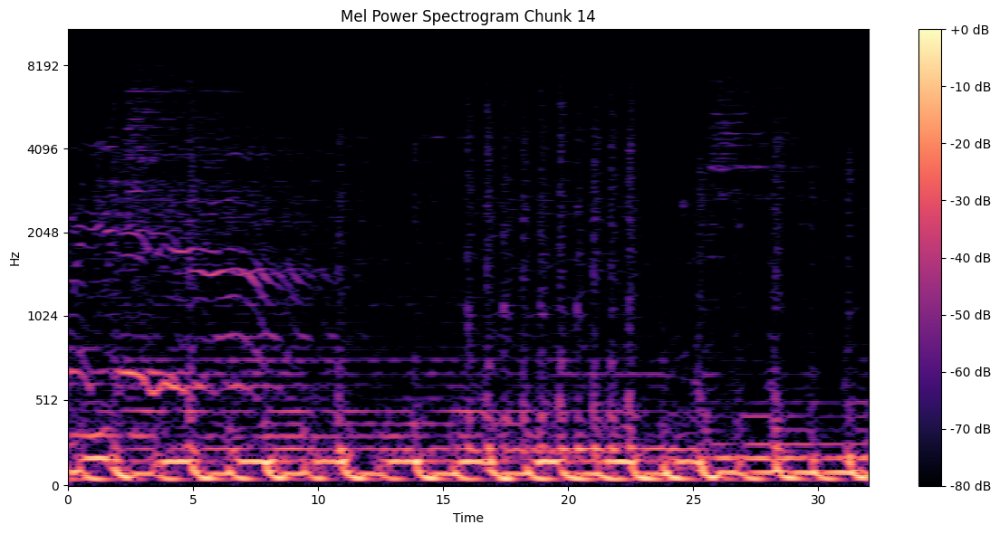

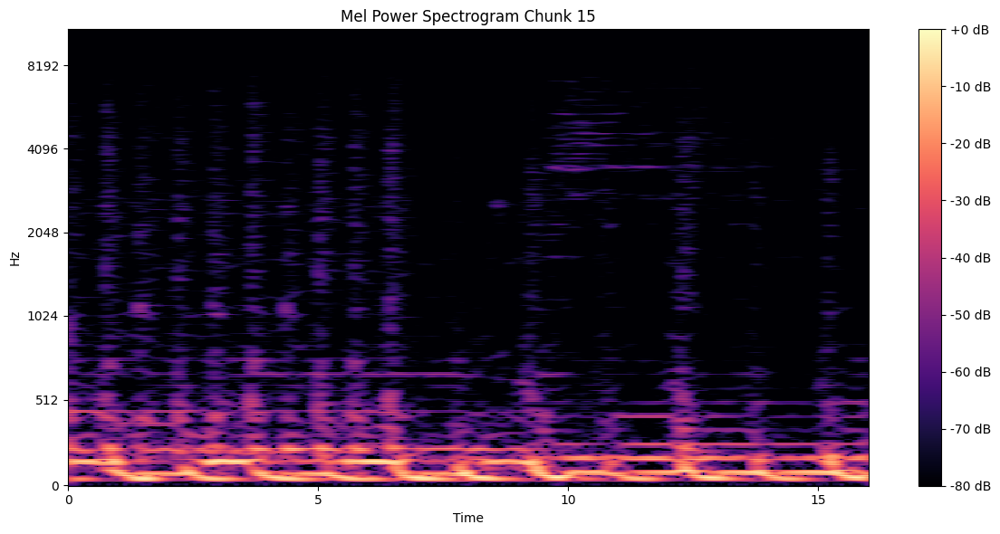

In [16]:
# Wizualizacja kawałków audio
plot_melspectrogram_chunks(y, sr, chunk_duration=4, overlap_duration=2, n_mels=512, n_fft=2048, hop_length=64, fig_size=(12, 6), cmap='magma')

In [17]:
classes = ['blues', 'classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

In [ ]:
import os
import torch
import librosa
import numpy as np
from torchvision import transforms

# Obliczenie mel-spektogramu
def calc_mel_spec(audio_data, sample_rate):
    # Tworzenie spektrogramu Mel za pomocą librosa
    mel_spec = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate, n_mels=128, fmax=8000)
    return mel_spec

# Przekształcenie do skali dB i normalizacja min–max
def min_max_normalize(mel_spectrogram):
    mel_spec_db = librosa.power_to_db(mel_spectrogram)
    mel_spec_db -= mel_spec_db.min()
    mel_spec_db /= mel_spec_db.max()
    return mel_spec_db

# Dopasowanie rozmiaru spektrogramu do kształtu wymaganego przez model
def resize_transform(mel_spectrogram_tensor, target_shape=(216, 144)):
    transform = transforms.Compose([
        transforms.Resize(target_shape),
    ])
    return transform(mel_spectrogram_tensor)

# Funkcja przygotowująca dane: wczytanie plików, podział, ekstrakcja spektrogramów
def load_and_preprocess_data(path_data, classes, target_shape=(216, 144)):
    data = []
    labels = []

    all_files = []
    
    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(path_data, class_name)
        print(f"Processing class: {class_name}")
        
        audio_files = [f for f in os.listdir(class_dir) if f.endswith('.wav')]
        
        for filename in audio_files:
            file_path = os.path.join(class_dir, filename)
            all_files.append((file_path, i_class))

    # 80% trening, 20% test
    num_train = int(0.8 * len(all_files))
    train_files = all_files[:num_train]
    test_files = all_files[num_train:]

    for file_list, data_type in zip([train_files, test_files], ['train', 'test']):
        print(f"Processing {data_type} files: {len(file_list)}")
        
        for file_path, label in file_list:
            try:
                # Wczytanie pliku audio
                audio_data, sample_rate = librosa.load(file_path, sr=None)
                
                # Parametry podziału nagrania
                chunk_duration = 4
                overlap_duration = 2
                
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
                
                for i in range(num_chunks):
                    start = i * (chunk_samples - overlap_samples)
                    end = start + chunk_samples
                    
                    chunk = audio_data[start:end]
                    
                    # Mel-spektrogram + normalizacja
                    mel_spectrogram = calc_mel_spec(chunk, sample_rate)
                    mel_spec_db = min_max_normalize(mel_spectrogram)
                    
                    # Konwersja do tensora i zmiana rozmiaru
                    mel_spectrogram_tensor = torch.tensor(mel_spec_db).unsqueeze(0).float()  # Dodanie wymiaru kanału
                    mel_spectrogram_resized = resize_transform(mel_spectrogram_tensor)
                    
                    # Dodanie do danych
                    data.append(mel_spectrogram_resized)
                    labels.append(label)
                    
            except Exception as e:
                print(f"Error processing file {file_path}: {e}")
    
    if len(data) == 0:
        print("No data to process.")
        return None, None
    
    data = torch.stack(data)
    labels = torch.tensor(labels)
    
    return data, labels


In [ ]:
data, labels = load_and_preprocess_data(path_data, classes)

Processing class: blues
Processing class: classical
Processing class: country
Processing class: disco
Processing class: hiphop
Processing class: jazz
Processing class: metal
Processing class: pop
Processing class: reggae
Processing class: rock
Processing train files: 800
Processing test files: 200


In [21]:
labels = torch.tensor(labels).clone().detach()
labels_one_hot = F.one_hot(labels, num_classes=len(classes))

print(labels_one_hot)

tensor([[1, 0, 0,  ..., 0, 0, 0],
        [1, 0, 0,  ..., 0, 0, 0],
        [1, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 1],
        [0, 0, 0,  ..., 0, 0, 1],
        [0, 0, 0,  ..., 0, 0, 1]])


C:\Users\artur\AppData\Local\Temp\ipykernel_29980\2970600799.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels).clone().detach()


In [22]:
print(labels_one_hot.shape)

torch.Size([14990, 10])


In [23]:
print("labels dtype:", labels.dtype)

labels dtype: torch.int64


In [ ]:
# Sprawdzenie dostępności CUDA i wypisanie informacji o urządzeniu
cuda_available = torch.cuda.is_available()
print(f"CUDA is available: {cuda_available}")

if cuda_available:
    device_name = torch.cuda.get_device_name(0)
    print(f"CUDA Device Name: {device_name}")

CUDA is available: True
CUDA Device Name: NVIDIA GeForce RTX 4070 SUPER


In [ ]:
# Podział danych i etykiet na zbiór treningowy i testowy
X_train, X_test, Y_train, Y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

In [26]:
import torch
from torch import nn
import numpy as np
import torch.nn.functional as F
import time
import copy
import math
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from torch.optim import AdamW, lr_scheduler

In [ ]:
# Implementacja straty Focal Loss (przydatna przy niezbalansowanych klasach)
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha          # Waga klasy – pozwala nadawać większe znaczenie rzadkim klasom
        self.gamma = gamma          # Skupienie na trudnych próbkach
        self.reduction = reduction  # Sposób agregacji strat (mean / sum / none)

    def forward(self, inputs, targets):
        # Standardowa strata CrossEntropy, bez redukcji
        ce_loss = F.cross_entropy(inputs, targets, reduction='none')

        # Obliczenie prawdopodobieństwa poprawnej klasy
        pt = torch.exp(-ce_loss)

        # Focal Loss – modyfikacja CrossEntropy, która skupia się na trudno klasyfikowanych próbkach        
        focal_loss = self.alpha * (1-pt)**self.gamma * ce_loss

        # Redukcja do jednej wartości (średnia, suma lub brak redukcji)
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Funkcja pomocnicza dla DropPath (stochastic depth – losowe pomijanie bloków rezydualnych)
def drop_path(x, drop_prob: float = 0., training: bool = False):
    if drop_prob == 0. or not training:  # Brak DropPath jeśli drop_prob=0 lub w trybie ewaluacji
        return x
    keep_prob = 1 - drop_prob
    shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # Tworzy maskę dla całej próbki w batchu
    random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
    random_tensor.floor_()  # Binarne maskowanie (0 lub 1)
    output = x.div(keep_prob) * random_tensor   # Skaluje pozostałe elementy, by zachować oczekiwaną wartość
    return output

# Warstwa DropPath jako moduł PyTorch
class DropPath(nn.Module):
    """Drop paths (Stochastic Depth) dla połączeń rezydualnych w blokach transformera.."""
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        return drop_path(x, self.drop_prob, self.training)

# SpecAugment – augmentacja danych audio w domenie spektrogramu
class SpecAugment(nn.Module):
    def __init__(self, freq_mask_param, time_mask_param, num_freq_masks=1, num_time_masks=1):
        super(SpecAugment, self).__init__()
        self.F = freq_mask_param        # Maksymalna szerokość maski częstotliwościowej
        self.T = time_mask_param        # Maksymalna szerokość maski czasowej
        self.num_freq_masks = num_freq_masks
        self.num_time_masks = num_time_masks

    def forward(self, x):
        if not self.training:        # Augmentacja stosowana tylko podczas treningu
            return x
            
        # x ma kształt [batch, channels, height, width]
        _, _, nu, tau = x.shape
        
        # Maskowanie losowych fragmentów częstotliwości
        for _ in range(self.num_freq_masks):
            f = np.random.uniform(low=0.0, high=self.F)
            f = int(f)
            f0 = np.random.randint(0, nu - f)
            x[:, :, f0:f0+f, :] = 0

        # Maskowanie losowych fragmentów czasu
        for _ in range(self.num_time_masks):
            t = np.random.uniform(low=0.0, high=self.T)
            t = int(t)
            t0 = np.random.randint(0, tau - t)
            x[:, :, :, t0:t0+t] = 0
            
        return x

In [ ]:
# Kodowanie pozycyjne 2D dla danych obrazowych/spektrogramów
class PositionalEncoding2D(nn.Module):
    def __init__(self, d_model, height, width):
        super(PositionalEncoding2D, self).__init__()

        # Parametryczna macierz kodowania pozycyjnego dla wszystkich patchy spektrogramu
        self.pe = nn.Parameter(torch.randn(1, height * width, d_model))
        
    def forward(self, x):
        # Dodanie kodowania pozycyjnego do embeddingów patchy
        return x + self.pe

In [ ]:
# Implementacja wielogłowej uwagi (Multi-Head Self-Attention)
class Attention(nn.Module):
    def __init__(self, dim, heads=8, dropout=0.2):
        super(Attention, self).__init__()
        self.heads = heads
        self.dim = dim
        self.head_dim = dim // heads        # Wymiar pojedynczej głowy uwagi
        self.query = nn.Linear(dim, dim)    # Warstwa projekcji zapytań
        self.key = nn.Linear(dim, dim)      # Warstwa projekcji kluczy
        self.value = nn.Linear(dim, dim)    # Warstwa projekcji wartości
        self.out = nn.Linear(dim, dim)      # Warstwa liniowa łącząca wyjścia wszystkich głów
        self.dropout = nn.Dropout(dropout)  # Dropout w macierzy uwagi
        
    def forward(self, x, mask=None):
        batch_size = x.size(0)
        
        # Projekcja wejścia na Q, K, V i podział na wiele głów
        q = self.query(x).view(batch_size, -1, self.heads, self.head_dim).transpose(1, 2)
        k = self.key(x).view(batch_size, -1, self.heads, self.head_dim).transpose(1, 2)
        v = self.value(x).view(batch_size, -1, self.heads, self.head_dim).transpose(1, 2)
        
        # Obliczenie macierzy podobieństwa między Q a K (skalowane produkty skalarne)
        scores = torch.matmul(q, k.transpose(-2, -1)) / np.sqrt(self.head_dim)

        # Zastosowanie maski (opcjonalnie), np. do ignorowania paddingu
        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)
        
        # Softmax – przekształcenie macierzy podobieństwa w prawdopodobieństwa uwagi
        attention = F.softmax(scores, dim=-1)
        attention = self.dropout(attention)

        # Przemnożenie macierzy uwagi przez wartości V
        out = torch.matmul(attention, v)

        # Złączenie głów z powrotem w oryginalny wymiar
        out = out.transpose(1, 2).contiguous().view(batch_size, -1, self.dim)

        # Projekcja liniowa wyjścia uwagi do wymiaru wejściowego
        out = self.out(out)

        return out


In [ ]:
# Klasyczny blok FeedForward stosowany w Transformerze
class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim, dropout=0.2):
        super(FeedForward, self).__init__()

        # Sekwencja warstw liniowych z nieliniowością i dropoutem
        self.net = nn.Sequential(
            nn.Linear(dim, hidden_dim), # Pierwsza warstwa liniowa zwiększa wymiar wejścia (projekcja do ukrytej przestrzeni)
            nn.GELU(),                  # Funkcja aktywacji nieliniowej GELU
            nn.Dropout(dropout),        # Dropout dla regularyzacji, zmniejsza przeuczenie
            nn.Linear(hidden_dim, dim), # Druga warstwa liniowa redukuje wymiar z powrotem do wymiaru wejścia
            nn.Dropout(dropout)         # Kolejny dropout po wyjściu warstwy
        )
        
    def forward(self, x):
        # Przepuszczenie wejścia przez sieć FeedForward
        return self.net(x)

In [ ]:
# Pojedynczy blok Transformer – uwaga + feedforward + normalizacje
class TransformerBlock(nn.Module):
    def __init__(self, dim, heads, hidden_dim, dropout=0.2, drop_path=0.):
        super(TransformerBlock, self).__init__()

        # Blok wielogłowej uwagi (self-attention)
        self.attention = Attention(dim, heads, dropout)

        # Blok FeedForward
        self.feed_forward = FeedForward(dim, hidden_dim, dropout)

        # Normalizacja warstw przed uwagą i FeedForward
        self.norm1 = nn.LayerNorm(dim)
        self.norm2 = nn.LayerNorm(dim)

        # Użycie DropPath zamiast Dropout na połączeniu rezydualnym
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        
    def forward(self, x, mask=None):
        # Blok uwagi + połączenie rezydualne z DropPath
        x = x + self.drop_path(self.attention(self.norm1(x), mask))

        # Blok FeedForward + połączenie rezydualne z DropPath
        x = x + self.drop_path(self.feed_forward(self.norm2(x)))
        
        return x

In [ ]:
# Główna klasa modelu bazującego na Vision Transformer dostosowanego do danych audio
class AudioTransformer(nn.Module):
    def __init__(self, patch_size=16, dim=128, depth=8, heads=8, hidden_dim=512, num_classes=10, dropout=0.2,
                 input_size=(216, 144), drop_path_rate=0.1):
        super(AudioTransformer, self).__init__()

        self.input_height, self.input_width = input_size
        self.patch_size = patch_size

        self.height = self.input_height // patch_size
        self.width = self.input_width // patch_size
        
        # Augmentacja danych w domenie spektrogramu (SpecAugment)
        self.spec_augment = SpecAugment(freq_mask_param=20, time_mask_param=20)
        
        # Dzieli obraz spektrogramu na paczki (patches) i mapuje je na wektory
        self.patch_embedding = nn.Conv2d(1, dim, kernel_size=patch_size, stride=patch_size)

        # Token klasy + jego embedding pozycyjny
        self.cls_token = nn.Parameter(torch.randn(1, 1, dim))
        self.cls_pos_embedding = nn.Parameter(torch.randn(1, 1, dim))

        # Kodowanie pozycyjne 2D dla patchy
        self.pos_embedding = PositionalEncoding2D(dim, height=self.height, width=self.width)
        self.dropout = nn.Dropout(dropout)
        
        # Liniowo zwiększane prawdopodobieństwo DropPath dla kolejnych bloków
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]
        
        # Stos kolejnych bloków transformera
        self.transformer_blocks = nn.ModuleList([
            TransformerBlock(dim, heads, hidden_dim, dropout, drop_path=dpr[i]) for i in range(depth)
        ])

        # Warstwa klasyfikacyjna
        self.classifier = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, num_classes)
        )
        
    def forward(self, x):
        batch_size = x.size(0)

        # SpecAugment stosowany tylko podczas treningu
        x = self.spec_augment(x)

        # Tworzenie embeddingów patchy
        x = self.patch_embedding(x)
        x = x.flatten(2).transpose(1, 2)
        
        # Dodanie informacji o pozycjach
        x = self.pos_embedding(x)
        
        # Dodanie tokena klasy
        cls_tokens = self.cls_token.expand(batch_size, -1, -1) + self.cls_pos_embedding.expand(batch_size, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        
        x = self.dropout(x)
        
        # Przepuszczenie przez kolejne bloki transformera
        for transformer_block in self.transformer_blocks:
            x = transformer_block(x)
        
        # Wektor klasyfikacyjny (pierwszy token)
        x = x[:, 0]
        x = self.classifier(x)
        
        return x


In [ ]:
# Funkcja trenująca model z early stopping i zapisem najlepszych wag
def train_model(model, dataloaders, criterion, optimizer, scheduler, device, num_epochs=25, patience=10):
    # Rejestracja czasu rozpoczęcia treningu w celu późniejszego pomiaru czasu wykonania
    since = time.time()
    
    # Inicjalizacja zmiennych do przechowywania najlepszych wag modelu oraz najlepszej dokładności walidacji
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Licznik epok bez poprawy dokładności walidacyjnej (do early stopping)
    patience_counter = 0
    
    # Słownik do przechowywania historii treningu i walidacji (straty i dokładności)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_acc': [],
        'val_acc': []
    }
    
    # Pętla po epokach treningu
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)
        
        for phase in ['train', 'val']:
            if phase == 'train':
                # Ustawienie modelu w tryb treningu
                model.train()
            else:
                # Tryb ewaluacji – wyłączenie mechanizmów treningowych
                model.eval()
                
            running_loss = 0.0      # Sumaryczna strata dla bieżącej fazy
            running_corrects = 0    # Liczba poprawnych predykcji dla bieżącej fazy
            
            # Iteracja po mini-batchach danych
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                optimizer.zero_grad()   # Wyzerowanie gradientów przed aktualizacją wag
                
                # Obliczanie predykcji i straty
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)             # Forward pass – predykcja modelu
                    _, preds = torch.max(outputs, 1)    # Wybranie klasy z najwyższym prawdopodobieństwem
                    loss = criterion(outputs, labels)   # Obliczenie straty
                    
                    # Aktualizacja wag tylko w fazie treningu
                    if phase == 'train':
                        loss.backward()     # Backpropagation – obliczenie gradientów
                        optimizer.step()    # Aktualizacja wag na podstawie gradientów
                # Akumulacja straty i liczby poprawnych predykcji        
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            
            # Obliczenie średniej straty i dokładności dla epoki
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            
            # Zapisanie wyników do historii treningu
            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
            else:
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())
            
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            
            # Early stopping – zapis najlepszych wag
            if phase == 'val':
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    patience_counter = 0
                else:
                    patience_counter += 1
            
            # Aktualizacja harmonogramu zmiany learning rate w zależności od straty walidacyjnej
            if phase == 'val' and scheduler is not None:
                scheduler.step(epoch_loss)

        # Przerwanie treningu w przypadku braku poprawy przez określoną liczbę epok (early stopping)
        if patience_counter >= patience:
            print(f"Early stopping aktywne: brak poprawy przez {patience} epok. Trening przerwany.")
            break
        
        print()
    
    # Pomiar czasu trwania treningu
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')
    
    # Załadowanie najlepszych wag modelu uzyskanych w trakcie treningu
    model.load_state_dict(best_model_wts)

    # Zwrócenie wytrenowanego modelu oraz historii treningu
    return model, history

In [ ]:
# Przygotowanie dataloaderów dla treningu, walidacji i testu
def prepare_data(X_train, X_test, Y_train, Y_test, batch_size=64):
    # Podział części treningowej na trening i walidację (10% na walidację)
    X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.1, random_state=42)
    
    # Utworzenie obiektów TensorDataset – łączą dane wejściowe z etykietami
    train_dataset = TensorDataset(X_train, Y_train)
    val_dataset = TensorDataset(X_val, Y_val)
    test_dataset = TensorDataset(X_test, Y_test)
    
    # Loader dla treningu z mieszaniem próbek (shuffle=True)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # Walidacja i test – bez mieszania, dla stabilności oceny
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    # Zbiorczy słownik – łatwy dostęp do wszystkich loaderów
    dataloaders = {
        'train': train_loader,
        'val': val_loader,
        'test': test_loader
    }
    
    return dataloaders

# Wizualizacja historii treningu (loss i accuracy)
def plot_training_history(history):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Loss over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    # Dokładność treningowa i walidacyjna
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy')
    plt.plot(history['val_acc'], label='Validation Accuracy')
    plt.title('Accuracy over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Ewaluacja modelu na zbiorze testowym
def evaluate_model(model, dataloader, device):
    model.eval()
    
    all_preds = []
    all_labels = []
    
    # Iteracja po batchach testowych – bez obliczania gradientów
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Predykcje modelu
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1) # wybór klasy o największym prawdopodobieństwie
            
            # Zapis wyników
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Dokładność ogólna + macierz pomyłek
    accuracy = accuracy_score(all_labels, all_preds)
    cm = confusion_matrix(all_labels, all_preds)
    
    return accuracy, cm

Using device: cuda:0
Epoch 1/150
----------
train Loss: 1.8017 Acc: 0.1162
val Loss: 1.7134 Acc: 0.1258

Epoch 2/150
----------


c:\Users\artur\Desktop\Studia\Poboczne_projekty\Music_Genre_Classification\.venv\lib\site-packages\torch\optim\lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


train Loss: 1.7005 Acc: 0.1478
val Loss: 1.6019 Acc: 0.1733

Epoch 3/150
----------
train Loss: 1.5820 Acc: 0.1914
val Loss: 1.5216 Acc: 0.2242

Epoch 4/150
----------
train Loss: 1.4950 Acc: 0.2340
val Loss: 1.4929 Acc: 0.2558

Epoch 5/150
----------
train Loss: 1.4060 Acc: 0.2685
val Loss: 1.3746 Acc: 0.2817

Epoch 6/150
----------
train Loss: 1.3554 Acc: 0.2896
val Loss: 1.2076 Acc: 0.3567

Epoch 7/150
----------
train Loss: 1.3087 Acc: 0.3136
val Loss: 1.1718 Acc: 0.3658

Epoch 8/150
----------
train Loss: 1.2606 Acc: 0.3282
val Loss: 1.1685 Acc: 0.3717

Epoch 9/150
----------
train Loss: 1.2032 Acc: 0.3525
val Loss: 1.1474 Acc: 0.3808

Epoch 10/150
----------
train Loss: 1.1961 Acc: 0.3552
val Loss: 1.1399 Acc: 0.3792

Epoch 11/150
----------
train Loss: 1.1677 Acc: 0.3706
val Loss: 1.0788 Acc: 0.4125

Epoch 12/150
----------
train Loss: 1.1499 Acc: 0.3741
val Loss: 1.1004 Acc: 0.3875

Epoch 13/150
----------
train Loss: 1.1309 Acc: 0.3779
val Loss: 1.1468 Acc: 0.3817

Epoch 14/15

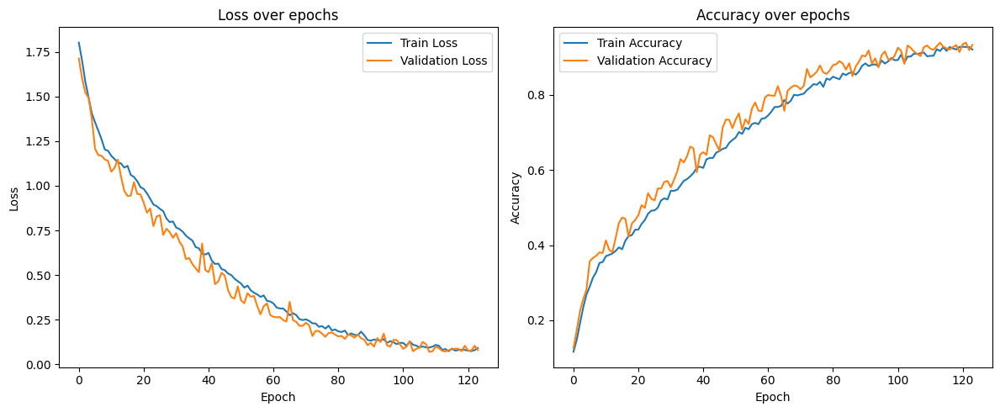

Test Accuracy: 0.9203


<Figure size 1000x800 with 0 Axes>

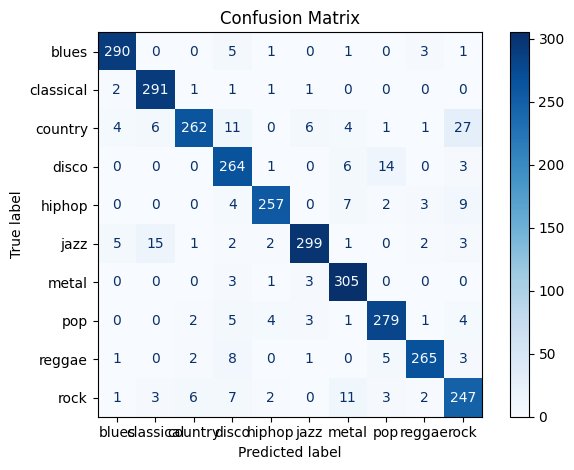

Model saved to audio_transformer_early_stop.pth


In [ ]:
def main():
    # Hiperparametry eksperymentu
    batch_size = 64
    num_epochs = 150
    learning_rate = 0.0001
    
    # Wybór urządzenia (GPU, jeśli dostępne; w przeciwnym razie CPU)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Przygotowanie dataloaderów (trening, walidacja, test)
    dataloaders = prepare_data(X_train, X_test, Y_train, Y_test, batch_size)
    
    # Inicjalizacja modelu Vision Transformer dla danych audio
    model = AudioTransformer(
        patch_size=16,      # rozmiar fragmentu obrazu spektrogramu
        dim=512,            # wymiar przestrzeni cech
        depth=8,            # liczba bloków transformera
        heads=8,            # liczba głów mechanizmu uwagi
        hidden_dim=2048,    # wymiar warstwy feed-forward
        num_classes=10,     # liczba gatunków muzycznych
        dropout=0.3,        # regularyzacja dropout
        drop_path_rate=0.2  # regularizacja stochastic depth
    )
    
    model = model.to(device)
    
    # Funkcja straty Focal Loss – lepsze radzenie sobie z klasami trudnymi / niezrównoważonymi
    criterion = FocalLoss(gamma=2.5) 

    # Optymalizator AdamW – wariant Adama z regularyzacją wag (weight decay)
    optimizer = AdamW(model.parameters(), lr=learning_rate, weight_decay=0.1)

    # Scheduler Cosine Annealing – stopniowe zmniejszanie LR zgodnie z funkcją kosinusoidalną
    scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-7)
    
    # Trening modelu z mechanizmem early stopping (patience=10)
    model, history = train_model(model, dataloaders, criterion, optimizer, scheduler, device, num_epochs=num_epochs, patience=10)
    
    # Wizualizacja przebiegu treningu (loss i accuracy)
    plot_training_history(history)
    
    # Ewaluacja modelu na zbiorze testowym
    test_accuracy, test_cm = evaluate_model(model, dataloaders['test'], device)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    # Macierz pomyłek – analiza jakości predykcji per-klasa
    plt.figure(figsize=(10, 8))
    disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()
    
    # Zapis wytrenowanego modelu na dysku
    torch.save(model.state_dict(), "audio_transformer_early_stop.pth")
    print("Model saved to audio_transformer_early_stop.pth")

# Uruchomienie głównej funkcji (punkt wejścia programu)
if __name__ == "__main__":
    main()

In [ ]:
# Dodatkowe importy dla analizy ROC, AUC, miar klasyfikacji i wizualizacji
from sklearn.metrics import (
    roc_curve, auc, roc_auc_score, 
    precision_score, recall_score, f1_score,
    classification_report, precision_recall_curve,
    average_precision_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Funkcja wykonująca rozszerzoną ewaluację modelu
def comprehensive_evaluation(model, dataloader, device, classes, class_names=None):
    """
    Kompleksowa ocena jakości klasyfikatora obejmująca:
    - miary klasyfikacji (accuracy, precision, recall, F1),
    - krzywe ROC i AUC (per-klasa, macro, micro),
    - krzywe Precision–Recall,
    - rozkłady prawdopodobieństw,
    - znormalizowaną macierz pomyłek,
    - szczegółowe metryki dla każdej klasy.
    
    Args:
        model: Wytrenowany model
        dataloader: DataLoader ze zbiorem testowym
        device: Urządzenie (CPU/GPU)
        classes: Lista nazw klas
        class_names: Opcjonalne nazwy klas do wyświetlania
    """
    model.eval()
    
    all_preds = []
    all_labels = []
    all_probs = []
    
    # Etap 1: zebranie predykcji i prawdopodobieństw ze zbioru testowego
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)   # rozkład prawdopodobieństw po softmax
            _, preds = torch.max(outputs, 1)    # etykieta z największym prawdopodobieństwem
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
     # Konwersja wyników do tablic NumPy (łatwiejsza analiza)
    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)
    
    n_classes = len(classes)
    
    if class_names is None:
        class_names = classes
    
    # --- 1. Podstawowe miary klasyfikacji ---
    print("="*60)
    print("PODSTAWOWE MIARY KLASYFIKACJI")
    print("="*60)
    
    # Dokładność ogólna
    accuracy = accuracy_score(all_labels, all_preds)
    print(f"Dokładność (Accuracy): {accuracy:.4f}")
    
    # Średnie uśrednione makro (każda klasa traktowana równoważnie)
    precision_macro = precision_score(all_labels, all_preds, average='macro')
    recall_macro = recall_score(all_labels, all_preds, average='macro')
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    
    print(f"Precyzja (Precision) - Macro: {precision_macro:.4f}")
    print(f"Czułość (Recall/Sensitivity) - Macro: {recall_macro:.4f}")
    print(f"Miara F1 - Macro: {f1_macro:.4f}")
    
    # Średnie uśrednione ważone (uwzględniają liczebność klas)
    precision_weighted = precision_score(all_labels, all_preds, average='weighted')
    recall_weighted = recall_score(all_labels, all_preds, average='weighted')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    
    print(f"Precyzja (Precision) - Weighted: {precision_weighted:.4f}")
    print(f"Czułość (Recall/Sensitivity) - Weighted: {recall_weighted:.4f}")
    print(f"Miara F1 - Weighted: {f1_weighted:.4f}")
    
    # Szczegółowy raport klasyfikacji (precision, recall, F1 per-klasa)
    print("\n" + "="*60)
    print("SZCZEGÓŁOWY RAPORT KLASYFIKACJI")
    print("="*60)
    print(classification_report(all_labels, all_preds, target_names=class_names, digits=4))
    

    # --- 2. Analiza ROC i AUC ---
    print("\n" + "="*60)
    print("ANALIZA ROC I AUC")
    print("="*60)
    
    # One-vs-rest: przygotowanie etykiet binarnych dla każdej klasy
    y_bin = label_binarize(all_labels, classes=range(n_classes))
    if n_classes == 2:  # obsługa przypadku binarnego
        y_bin = np.hstack([1 - all_labels.reshape(-1, 1), all_labels.reshape(-1, 1)])
    
    fpr = {}
    tpr = {}
    roc_auc = {}
    
    plt.figure(figsize=(15, 10))
    
    # ROC i AUC dla każdej klasy osobno
    plt.subplot(2, 2, 1)
    colors = plt.cm.Set1(np.linspace(0, 1, n_classes))
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], all_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
                label=f'{class_names[i]} (AUC = {roc_auc[i]:.3f})')
        print(f"AUC dla klasy {class_names[i]}: {roc_auc[i]:.4f}")
    
    # Krzywa ROC micro-average (wszystkie próbki traktowane łącznie)
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), all_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle=':', linewidth=4,
            label=f'Micro-average (AUC = {roc_auc["micro"]:.3f})')
    
    # Krzywa ROC macro-average (średnia z wyników dla klas)
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    plt.plot(fpr["macro"], tpr["macro"], color='navy', linestyle=':', linewidth=4,
            label=f'Macro-average (AUC = {roc_auc["macro"]:.3f})')
    
    plt.plot([0, 1], [0, 1], 'k--', lw=2, alpha=0.5)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title('Krzywe ROC dla wszystkich klas')
    plt.legend(loc="lower right", fontsize=8)
    plt.grid(True, alpha=0.3)
    
    print(f"\nAUC Micro-average: {roc_auc['micro']:.4f}")
    print(f"AUC Macro-average: {roc_auc['macro']:.4f}")
    

    # --- 3. Krzywe Precision–Recall ---
    plt.subplot(2, 2, 2)
    
    avg_precision = {}
    for i in range(n_classes):
        precision_curve, recall_curve, _ = precision_recall_curve(y_bin[:, i], all_probs[:, i])
        avg_precision[i] = average_precision_score(y_bin[:, i], all_probs[:, i])
        plt.plot(recall_curve, precision_curve, color=colors[i], lw=2,
                label=f'{class_names[i]} (AP = {avg_precision[i]:.3f})')
    
    plt.xlabel('Recall (Czułość)')
    plt.ylabel('Precision (Precyzja)')
    plt.title('Krzywe Precision-Recall')
    plt.legend(loc="lower left", fontsize=8)
    plt.grid(True, alpha=0.3)
    

    # --- 4. Rozkład prawdopodobieństw ---
    plt.subplot(2, 2, 3) 
    for i in range(min(5, n_classes)):   # maks. 5 klas dla czytelności
        class_probs = all_probs[all_labels == i, i]
        plt.hist(class_probs, bins=20, alpha=0.7, label=f'{class_names[i]}', 
                color=colors[i], density=True)
    
    plt.xlabel('Prawdopodobieństwo predykcji')
    plt.ylabel('Gęstość')
    plt.title('Rozkład prawdopodobieństw dla klas')
    plt.legend(fontsize=8)
    plt.grid(True, alpha=0.3)
    

    # --- 5. Znormalizowana macierz pomyłek ---
    plt.subplot(2, 2, 4)
    
    cm_normalized = confusion_matrix(all_labels, all_preds, normalize='true')
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Znormalizowana macierz pomyłek')
    plt.xlabel('Predykowana klasa')
    plt.ylabel('Rzeczywista klasa')
    
    plt.tight_layout()
    plt.show()
    

    # --- 6. Analiza dla każdej klasy osobno ---
    print("\n" + "="*60)
    print("SZCZEGÓŁOWA ANALIZA DLA KAŻDEJ KLASY")
    print("="*60)
    
    for i, class_name in enumerate(class_names):
        class_mask = (all_labels == i)
        class_preds_binary = (all_preds == i)
        
        if np.sum(class_mask) > 0:
            precision = precision_score(class_mask, class_preds_binary)
            recall = recall_score(class_mask, class_preds_binary)
            f1 = f1_score(class_mask, class_preds_binary)
            
            # Specyficzność = TN / (TN + FP)
            tn = np.sum((~class_mask) & (~class_preds_binary))
            fp = np.sum((~class_mask) & class_preds_binary)
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
            
            print(f"\nKlasa: {class_name}")
            print(f"  Precyzja:    {precision:.4f}")
            print(f"  Czułość:     {recall:.4f}")
            print(f"  Specyficzność: {specificity:.4f}")
            print(f"  F1-Score:    {f1:.4f}")
            print(f"  AUC:         {roc_auc[i]:.4f}")
            print(f"  AP (Average Precision): {avg_precision[i]:.4f}")
    
    # Zwracanie wyników w formie słownika (do dalszej analizy / raportowania)
    results = {
        'accuracy': accuracy,
        'precision_macro': precision_macro,
        'recall_macro': recall_macro,
        'f1_macro': f1_macro,
        'precision_weighted': precision_weighted,
        'recall_weighted': recall_weighted,
        'f1_weighted': f1_weighted,
        'auc_macro': roc_auc['macro'],
        'auc_micro': roc_auc['micro'],
        'per_class_auc': {class_names[i]: roc_auc[i] for i in range(n_classes)},
        'per_class_ap': {class_names[i]: avg_precision[i] for i in range(n_classes)}
    }
    
    return results

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
PODSTAWOWE MIARY KLASYFIKACJI
Dokładność (Accuracy): 0.9203
Precyzja (Precision) - Macro: 0.9213
Czułość (Recall/Sensitivity) - Macro: 0.9207
Miara F1 - Macro: 0.9199
Precyzja (Precision) - Weighted: 0.9223
Czułość (Recall/Sensitivity) - Weighted: 0.9203
Miara F1 - Weighted: 0.9201

SZCZEGÓŁOWY RAPORT KLASYFIKACJI
              precision    recall  f1-score   support

       blues     0.9571    0.9635    0.9603       301
   classical     0.9238    0.9798    0.9510       297
     country     0.9562    0.8137    0.8792       322
       disco     0.8516    0.9167    0.8829       288
      hiphop     0.9554    0.9113    0.9328       282
        jazz     0.9553    0.9061    0.9300       330
       metal     0.9077    0.9776    0.9414       312
         pop     0.9178    0.9331    0.9254       299
      reggae     0.9567    0.9298    0.9431       285
        rock     0.8316    0.8759    0.8532       282

    accuracy                     

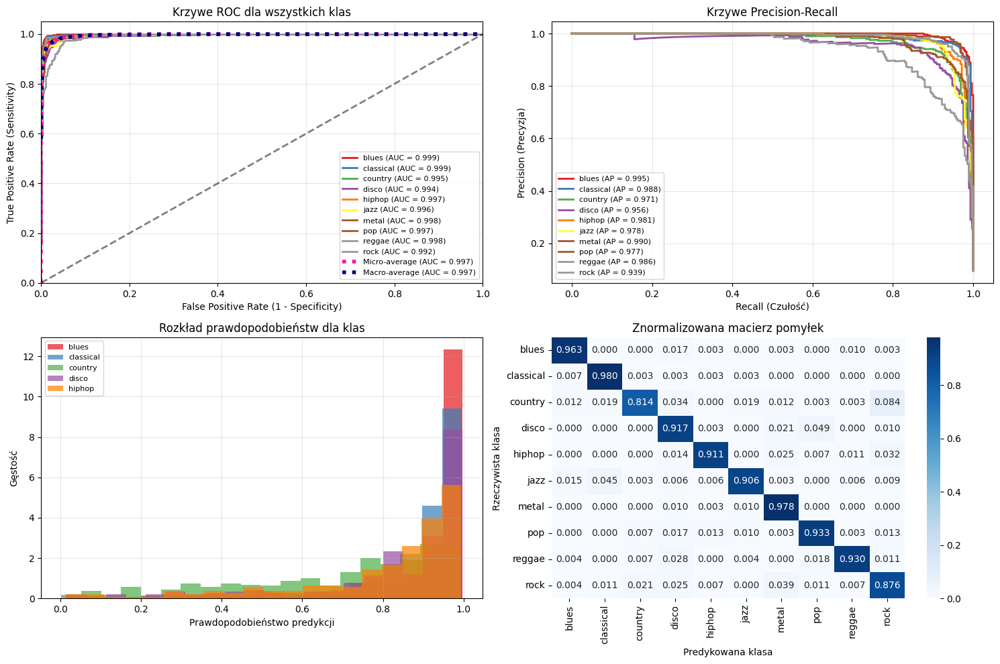


SZCZEGÓŁOWA ANALIZA DLA KAŻDEJ KLASY

Klasa: blues
  Precyzja:    0.9571
  Czułość:     0.9635
  Specyficzność: 0.9952
  F1-Score:    0.9603
  AUC:         0.9994
  AP (Average Precision): 0.9949

Klasa: classical
  Precyzja:    0.9238
  Czułość:     0.9798
  Specyficzność: 0.9911
  F1-Score:    0.9510
  AUC:         0.9986
  AP (Average Precision): 0.9883

Klasa: country
  Precyzja:    0.9562
  Czułość:     0.8137
  Specyficzność: 0.9955
  F1-Score:    0.8792
  AUC:         0.9950
  AP (Average Precision): 0.9714

Klasa: disco
  Precyzja:    0.8516
  Czułość:     0.9167
  Specyficzność: 0.9830
  F1-Score:    0.8829
  AUC:         0.9937
  AP (Average Precision): 0.9564

Klasa: hiphop
  Precyzja:    0.9554
  Czułość:     0.9113
  Specyficzność: 0.9956
  F1-Score:    0.9328
  AUC:         0.9971
  AP (Average Precision): 0.9814

Klasa: jazz
  Precyzja:    0.9553
  Czułość:     0.9061
  Specyficzność: 0.9948
  F1-Score:    0.9300
  AUC:         0.9959
  AP (Average Precision): 0.9783

K

In [ ]:
# Funkcja do załadowania wytrenowanego modelu
def load_model(model_path):
    # Wybór urządzenia obliczeniowego (GPU jeśli dostępne, w przeciwnym razie CPU)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Używane urządzenie: {device}")
    
    # Lista etykiet klas odpowiadających gatunkom muzycznym w zbiorze GTZAN
    class_names = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
    
    # Inicjalizacja modelu AudioTransformer
    model = AudioTransformer(
        patch_size=16,
        dim=512,            # Wymiar wektorów cech
        depth=8,            # Liczba bloków transformera
        heads=8,            # Liczba głów uwagi
        hidden_dim=2048,    # Wymiar warstwy ukrytej
        num_classes=10,     # Liczba klas (gatunków muzycznych)
        dropout=0.2,        # Współczynnik dropout
        drop_path_rate=0.2        
    )
    
    # Przeniesienie modelu na odpowiednie urządzenie (CPU/GPU)
    model = model.to(device)
    
    try:
        # Wczytanie zapisanych wag modelu
        model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
        print("Model załadowany pomyślnie!")
        return model, device, class_names
    except Exception as e:
        # Obsługa błędu w przypadku problemu z ładowaniem wag
        print(f"Błąd ładowania modelu: {e}")
        return None, device, class_names

# Łączenie ładowania modelu z przygotowaniem zbiorów danych
def load_model_and_prepare_data(model_path, X_train, X_test, Y_train, Y_test, batch_size=64):
    model, device, class_names = load_model(model_path)
    
    if model is not None:
        # Podział i przygotowanie danych do DataLoaderów (train/val/test
        dataloaders = prepare_data(X_train, X_test, Y_train, Y_test, batch_size)
        return model, device, class_names, dataloaders
    else:
        return None, device, class_names, None

# Ewaluacja końcowa modelu na zbiorze testowym
model, device, class_names, dataloaders = load_model_and_prepare_data(
    'audio_transformer_early_stop.pth', 
    X_train, X_test, Y_train, Y_test
)

if model is not None and dataloaders is not None:
    # Kompleksowa ewaluacja (dokładność, raport klasyfikacji, ROC/AUC itd.)
    results = comprehensive_evaluation(
        model=model, 
        dataloader=dataloaders['test'], 
        device=device, 
        classes=list(range(10)),  # [0, 1, 2, ..., 9]
        class_names=class_names
    )
    
    print("\Ewaluacja zakończona pomyślnie!")
    print(f"Osiągnięta wydajność: Accuracy = {results['accuracy']:.4f}")
else:
    print("Błąd: Nie udało się załadować modelu lub przygotować danych!")

In [ ]:
# Podgląd warstw i liczby parametrów w modelu
summary(model, (1, 216, 144))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
       SpecAugment-1          [-1, 1, 216, 144]               0
            Conv2d-2           [-1, 512, 13, 9]         131,584
PositionalEncoding2D-3             [-1, 117, 512]               0
           Dropout-4             [-1, 118, 512]               0
         LayerNorm-5             [-1, 118, 512]           1,024
            Linear-6             [-1, 118, 512]         262,656
            Linear-7             [-1, 118, 512]         262,656
            Linear-8             [-1, 118, 512]         262,656
           Dropout-9          [-1, 8, 118, 118]               0
           Linear-10             [-1, 118, 512]         262,656
        Attention-11             [-1, 118, 512]               0
         Identity-12             [-1, 118, 512]               0
        LayerNorm-13             [-1, 118, 512]           1,024
           Linear-14            [-1, 

In [ ]:
# Tworzy mel-spektrogram z pliku audio i zwraca go w formacie gotowym do modelu
def extract_melspectrogram(audio_path, sr=22050, n_fft=2048, hop_length=512, n_mels=128, duration=3):
    """
    Zwraca mel-spektrogram, sygnał audio i parametry próbkowania.

    Args:
        audio_path: ścieżka do pliku audio
        sr: częstotliwość próbkowania
        n_fft: wielkość okna FFT
        hop_length: przeskok między oknami
        n_mels: liczba filtrów mel
        duration: długość próbki w sekundach
    
    Returns:
        spektrogram mel jako tensor PyTorch
    """
    try:
        # Wczytanie pliku audio (sygnał y i sampling rate sr)
        # Ucinamy lub pobieramy tylko fragment o zadanej długości (duration w sekundach)        
        y, _ = librosa.load(audio_path, sr=sr, duration=duration)
    except Exception as e:
        print(f"Błąd wczytywania pliku audio: {e}")
        return None

    # Dopasowanie długości sygnału:
    # jeśli krótszy niż zakładana długość - uzupełniamy zerami,
    # jeśli dłuższy - przycinamy do wymaganej długości    
    if len(y) < sr * duration:
        y = np.pad(y, (0, sr * duration - len(y)), 'constant')
    else:
        y = y[:sr * duration]
    
    # Wyliczenie mel-spektrogramu (częstotliwości → skala mel)
    mel_spectrogram = librosa.feature.melspectrogram(
        y=y, 
        sr=sr, 
        n_fft=n_fft, 
        hop_length=hop_length, 
        n_mels=n_mels
    )
    
    # Przekształcenie amplitud na skalę decybelową
    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

    # Konwersja do tensora PyTorch w formacie [channels, height, width]
    # unsqueeze(0) dodaje wymiar kanału (tu: mono - 1 kanał)
    mel_normalized = (mel_spectrogram_db - mel_spectrogram_db.min()) / (mel_spectrogram_db.max() - mel_spectrogram_db.min())
    mel_tensor = torch.FloatTensor(mel_normalized).unsqueeze(0)

    return mel_tensor, y, sr, mel_spectrogram

In [ ]:
# Klasyfikuje plik audio i zwraca prawdopodobieństwa dla każdego gatunku
def classify_music(model, audio_path, device, class_names):
    """
    Przetwarza plik audio na spektrogram i zwraca wyniki klasyfikacji.
    
    Args:
        model: załadowany model PyTorch
        audio_path: ścieżka do pliku audio
        device: urządzenie (CPU/GPU)
        class_names: lista nazw gatunków muzycznych
    
    Returns:
        słownik z prawdopodobieństwami dla każdego gatunku
    """

    # Ekstrakcja mel-spektrogramu z pliku audio
    mel_tensor, y, sr, mel_spec = extract_melspectrogram(audio_path)
    if mel_tensor is None:
        return None
    
    print(f"Oryginalny kształt spektrogramu: {mel_tensor.shape}")

    # Docelowe wymiary wejściowe modelu
    desired_height = 216
    desired_width = 144
    
    # Zmiana rozmiaru spektrogramu do wymagań modelu
    mel_tensor = F.interpolate(
        mel_tensor.unsqueeze(0), # dodanie wymiaru batch przed interpolacją
        size=(desired_height, desired_width),
        mode='bilinear',
        align_corners=False
    ).squeeze(0) # usunięcie dodatkowego wymiaru
    
    print(f"Kształt po zmianie rozmiaru: {mel_tensor.shape}")
    mel_tensor = mel_tensor.to(device)
    
    # Wyłączenie trybu treningowego i obliczania gradientów
    model.eval()
    with torch.no_grad():
        # Dodanie wymiaru batch i uzyskanie predykcji modelu
        outputs = model(mel_tensor.unsqueeze(0))
        # Softmax - konwersja wyników na prawdopodobieństwa klas
        probabilities = F.softmax(outputs, dim=1)[0]
    
    # Utworzenie słownika: {nazwa_gatunku: prawdopodobieństwo [%]}
    predictions = {class_names[i]: prob.item() * 100 for i, prob in enumerate(probabilities)}
    return predictions, y, sr, mel_spec

In [ ]:
def display_full_song_results(aggregated_predictions, audio_path, segment_predictions=None):
    """
    Pokazuje wyniki klasyfikacji całego utworu (i segmentów, jeśli podane).
    
    Args:
        aggregated_predictions: zagregowane prawdopodobieństwa dla każdego gatunku
        audio_path: ścieżka do pliku audio
        segment_predictions: lista predykcji dla poszczególnych segmentów (opcjonalnie)
    """

    # Posortowanie gatunków według prawdopodobieństwa malejąco
    sorted_predictions = dict(sorted(aggregated_predictions.items(), key=lambda x: x[1], reverse=True))
    
    # Wykres słupkowy zagregowanych wyników (dla całego utworu)
    plt.figure(figsize=(12, 6))
    bars = plt.bar(sorted_predictions.keys(), sorted_predictions.values(), color='skyblue')
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Klasyfikacja gatunku muzycznego (cały utwór): {os.path.basename(audio_path)}')
    plt.xlabel('Gatunek muzyczny')
    plt.ylabel('Prawdopodobieństwo (%)')
    
    # Dodanie wartości procentowych nad słupkami
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                 f'{height:.1f}%', ha='center', va='bottom')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Wypisanie wyników w konsoli (w formie tabelarycznej)
    print(f"\nWyniki klasyfikacji dla całego utworu: {os.path.basename(audio_path)}")
    print("=" * 50)
    for genre, prob in sorted_predictions.items():
        print(f"{genre:<15}: {prob:.2f}%")
    print("=" * 50)
    
    # Gatunek z najwyższym prawdopodobieństwem
    top_genre = max(aggregated_predictions.items(), key=lambda x: x[1])
    print(f"Najwyższe prawdopodobieństwo: {top_genre[0]} ({top_genre[1]:.2f}%)")
    
    # Jeśli podano predykcje dla segmentów – wizualizacja zmian w czasie
    if segment_predictions:
        # Przygotowanie danych do wykresu
        genres = list(segment_predictions[0].keys())
        segments_count = len(segment_predictions)
        
        # Przygotowanie danych do wykresu liniowego (prawdopodobieństwa w kolejnych segmentach)
        data = {genre: [pred[genre] for pred in segment_predictions] for genre in genres}
        
        plt.figure(figsize=(14, 8))
        for genre in genres:
            plt.plot(range(segments_count), data[genre], label=genre, linewidth=2)
        
        plt.title('Zmiana prawdopodobieństwa gatunków w czasie')
        plt.xlabel('Segment utworu')
        plt.ylabel('Prawdopodobieństwo (%)')
        plt.legend(loc='upper right')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

In [ ]:
def analyze_full_song(audio_path, model_path='audio_transformer_early_stop.pth', segment_duration=3, overlap=1.5):
    """
    Analiza całego utworu na podstawie segmentów audio.
    
    Args:
        audio_path: ścieżka do pliku audio
        model_path: ścieżka do wytrenowanego modelu
        segment_duration: długość pojedynczego segmentu w sekundach
        overlap: nakładanie się segmentów w sekundach
    """
    
    # Załadowanie wytrenowanego modelu oraz listy gatunków
    model, device, class_names = load_model(model_path)
    if model is None:
        return
    
    # Weryfikacja, czy plik audio istnieje
    if not os.path.exists(audio_path):
        print(f"Plik {audio_path} nie istnieje.")
        return
    
    # Wczytanie całego utworu w jednolitej częstotliwości próbkowania
    try:
        y, sr = librosa.load(audio_path, sr=22050)
        print(f"Wczytano utwór, długość: {len(y)/sr:.2f} sekund")
    except Exception as e:
        print(f"Błąd wczytywania pliku audio: {e}")
        return
    
    # Obliczenie parametrów segmentacji (uwzględniając nakładanie się fragmentów)
    hop_length = int(sr * (segment_duration - overlap))
    n_segments = max(1, int((len(y) - sr * segment_duration) / hop_length) + 1)
    print(f"Liczba segmentów do analizy: {n_segments}")
    
    all_predictions = []
    
    for i in range(n_segments):
        # Wycięcie fragmentu utworu odpowiadającego aktualnemu segmentowi
        start_sample = i * hop_length
        end_sample = min(len(y), start_sample + int(sr * segment_duration))
        segment = y[start_sample:end_sample]

        # Uzupełnienie zerami w przypadku zbyt krótkiego segmentu
        if len(segment) < sr * segment_duration:
            segment = np.pad(segment, (0, int(sr * segment_duration) - len(segment)), 'constant')
        
        # Obliczenie mel-spektrogramu dla wycinka
        mel_spec = librosa.feature.melspectrogram(
            y=segment, 
            sr=sr, 
            n_fft=2048, 
            hop_length=512, 
            n_mels=128
        )
        
        # Przekształcenie do skali decybelowej i normalizacja [0,1]
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        mel_normalized = (mel_spec_db - mel_spec_db.min()) / (mel_spec_db.max() - mel_spec_db.min())
        
        # Konwersja do tensora PyTorch
        mel_tensor = torch.FloatTensor(mel_normalized).unsqueeze(0)
        
        # Dopasowanie rozmiarów wejściowych do wymagań modelu
        desired_height = 216
        desired_width = 144
        
        mel_tensor = F.interpolate(
            mel_tensor.unsqueeze(0),
            size=(desired_height, desired_width),
            mode='bilinear',
            align_corners=False
        ).squeeze(0)
        
        mel_tensor = mel_tensor.to(device)
        
        # Przekazanie segmentu do modelu i obliczenie prawdopodobieństw
        model.eval()
        with torch.no_grad():
            outputs = model(mel_tensor.unsqueeze(0))
            probabilities = F.softmax(outputs, dim=1)[0].cpu().numpy()
            
        # Zapisanie predykcji dla bieżącego segmentu
        segment_predictions = {class_names[i]: probabilities[i] * 100 for i in range(len(class_names))}
        all_predictions.append(segment_predictions)
        
        # Informacja o postępie analizy
        print(f"Przeanalizowano segment {i+1}/{n_segments} ({start_sample/sr:.1f}s - {end_sample/sr:.1f}s)")
    
    # Agregacja wyników – uśrednianie prawdopodobieństw po wszystkich segmentach
    aggregated_predictions = {}
    for genre in class_names:
        genre_probs = [pred[genre] for pred in all_predictions]
        aggregated_predictions[genre] = sum(genre_probs) / len(genre_probs)
    
    # Wizualizacja wyników: prawdopodobieństwa + ewolucja w czasie
    display_full_song_results(aggregated_predictions, audio_path, all_predictions)
    
    return aggregated_predictions, all_predictions


Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.00 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


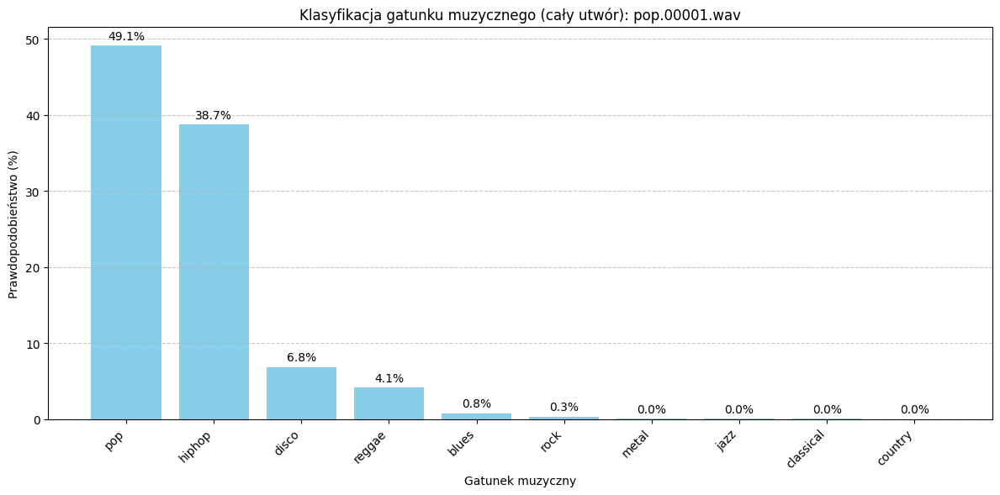


Wyniki klasyfikacji dla całego utworu: pop.00001.wav
pop            : 49.14%
hiphop         : 38.74%
disco          : 6.82%
reggae         : 4.12%
blues          : 0.78%
rock           : 0.33%
metal          : 0.04%
jazz           : 0.03%
classical      : 0.01%
country        : 0.00%
Najwyższe prawdopodobieństwo: pop (49.14%)


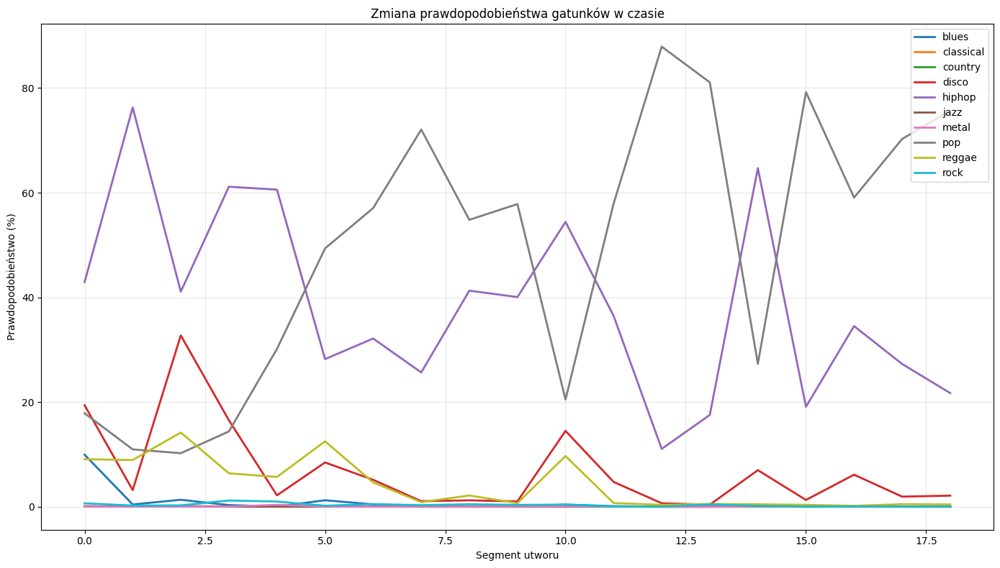

({'blues': 0.775287139875122,
  'classical': 0.01075227985079676,
  'country': 0.0019046056159392098,
  'disco': 6.81701190402045,
  'hiphop': 38.74108391372781,
  'jazz': 0.030822543885733467,
  'metal': 0.04076624055941418,
  'pop': 49.13948884135798,
  'reggae': 4.115747415926307,
  'rock': 0.3271354314883387},
 [{'blues': 9.93303582072258,
   'classical': 0.04447219835128635,
   'country': 0.004701827128883451,
   'disco': 19.382329285144806,
   'hiphop': 42.923134565353394,
   'jazz': 0.11063308920711279,
   'metal': 0.016594654880464077,
   'pop': 17.85217821598053,
   'reggae': 9.082671254873276,
   'rock': 0.6502456963062286},
  {'blues': 0.4198813810944557,
   'classical': 0.0027374388082535006,
   'country': 0.001213427367474651,
   'disco': 3.172016143798828,
   'hiphop': 76.28671526908875,
   'jazz': 0.020599963318090886,
   'metal': 0.01396717707393691,
   'pop': 10.95038577914238,
   'reggae': 8.911234885454178,
   'rock': 0.22124641109257936},
  {'blues': 1.3236925937235

In [44]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/pop/pop.00001.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.00 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


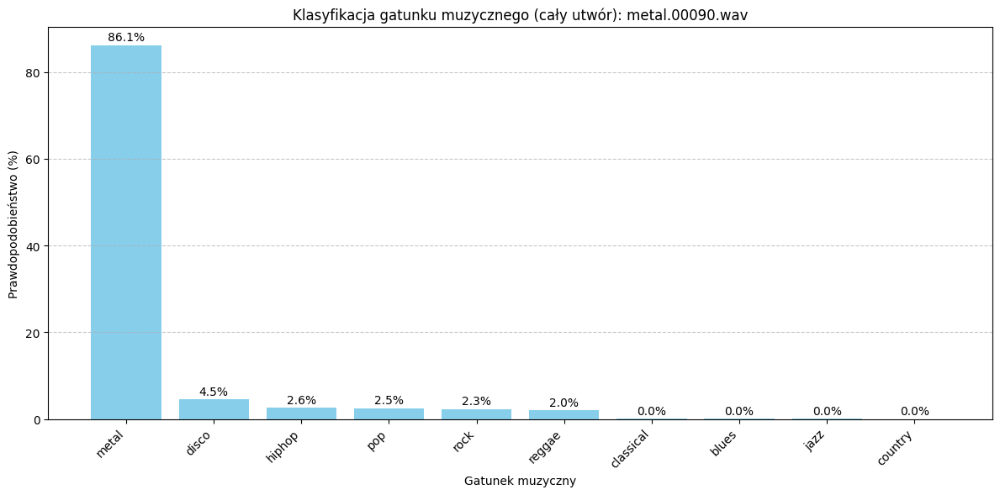


Wyniki klasyfikacji dla całego utworu: metal.00090.wav
metal          : 86.09%
disco          : 4.52%
hiphop         : 2.55%
pop            : 2.50%
rock           : 2.31%
reggae         : 1.96%
classical      : 0.03%
blues          : 0.02%
jazz           : 0.01%
country        : 0.00%
Najwyższe prawdopodobieństwo: metal (86.09%)


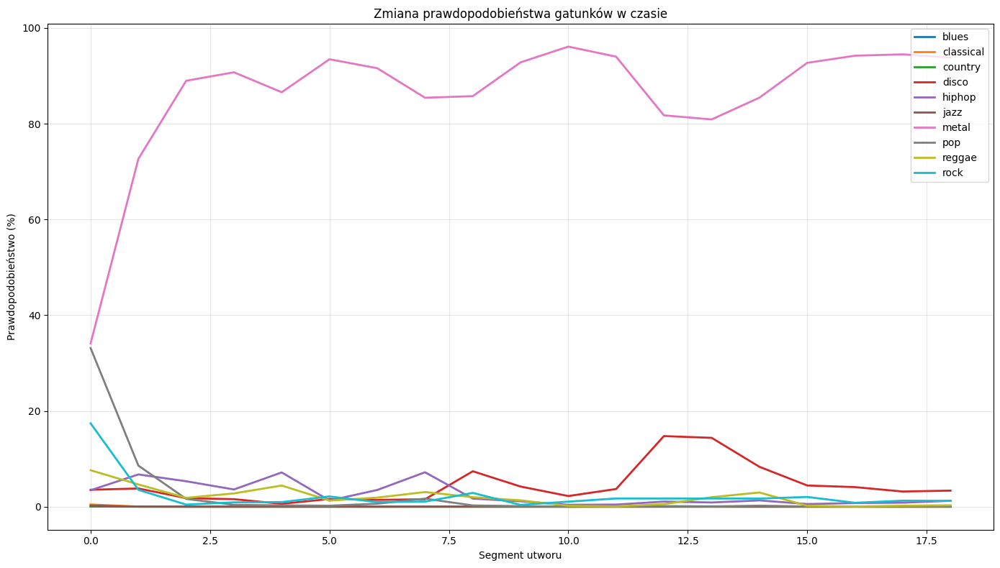

({'blues': 0.017825775744552772,
  'classical': 0.027760075203045027,
  'country': 0.002435372583644685,
  'disco': 4.5227817063661,
  'hiphop': 2.5530712164350247,
  'jazz': 0.014918340979133254,
  'metal': 86.09028333111813,
  'pop': 2.4984783299212148,
  'reggae': 1.9636492756513977,
  'rock': 2.308796609653846},
 [{'blues': 0.023583014262840152,
   'classical': 0.46205748803913593,
   'country': 0.019548657292034477,
   'disco': 3.5312961786985397,
   'hiphop': 3.4383047372102737,
   'jazz': 0.24340800009667873,
   'metal': 34.12249684333801,
   'pop': 33.13143849372864,
   'reggae': 7.613968849182129,
   'rock': 17.41388738155365},
  {'blues': 0.007908372208476067,
   'classical': 0.017979905533138663,
   'country': 0.0032326246582670137,
   'disco': 3.8070745766162872,
   'hiphop': 6.737145781517029,
   'jazz': 0.007892700523370877,
   'metal': 72.66383171081543,
   'pop': 8.583427965641022,
   'reggae': 4.648828878998756,
   'rock': 3.5226721316576004},
  {'blues': 0.00082323485

In [45]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/metal/metal.00090.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.01 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


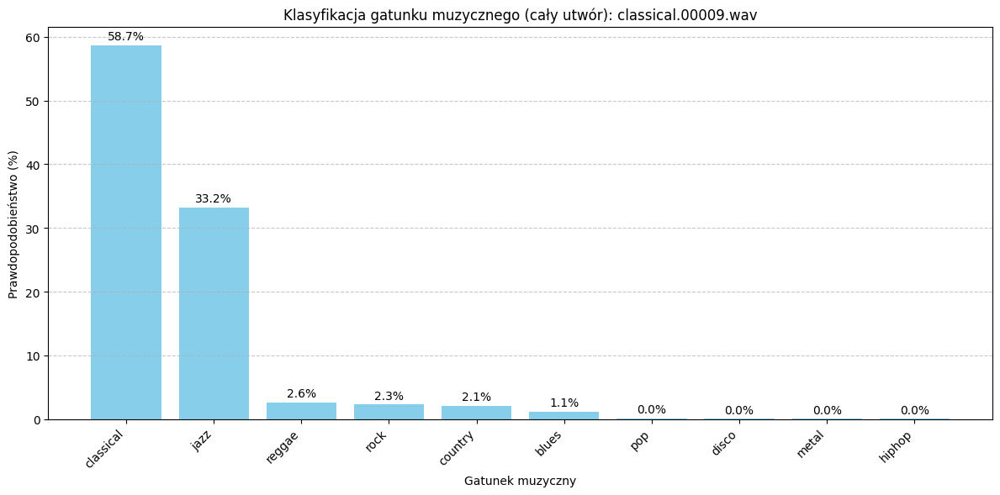


Wyniki klasyfikacji dla całego utworu: classical.00009.wav
classical      : 58.67%
jazz           : 33.20%
reggae         : 2.61%
rock           : 2.27%
country        : 2.05%
blues          : 1.09%
pop            : 0.04%
disco          : 0.03%
metal          : 0.02%
hiphop         : 0.02%
Najwyższe prawdopodobieństwo: classical (58.67%)


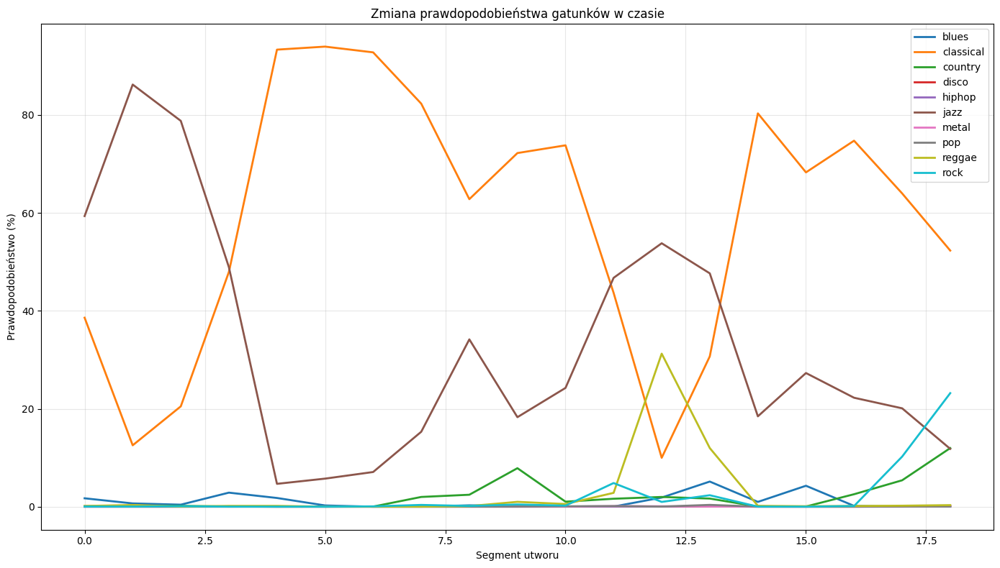

({'blues': 1.0903396769208484,
  'classical': 58.66555940163763,
  'country': 2.0529952024509455,
  'disco': 0.032105069610559825,
  'hiphop': 0.017961548560139675,
  'jazz': 33.200386990057794,
  'metal': 0.02454053387258395,
  'pop': 0.04009069560341136,
  'reggae': 2.6056619759736734,
  'rock': 2.270358232061354},
 [{'blues': 1.7148181796073914,
   'classical': 38.5909229516983,
   'country': 0.07983024115674198,
   'disco': 0.08577900007367134,
   'hiphop': 0.002758164919214323,
   'jazz': 59.34528708457947,
   'metal': 0.0018640068446984515,
   'pop': 0.0009483235771767795,
   'reggae': 0.1435565180145204,
   'rock': 0.034226037678308785},
  {'blues': 0.6680948659777641,
   'classical': 12.538091838359833,
   'country': 0.14561032876372337,
   'disco': 0.07012470159679651,
   'hiphop': 0.005531572242034599,
   'jazz': 86.20140552520752,
   'metal': 0.0034862739994423464,
   'pop': 0.0010433586794533767,
   'reggae': 0.34400925505906343,
   'rock': 0.0225975745706819},
  {'blues': 

In [46]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/classical/classical.00009.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.17 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


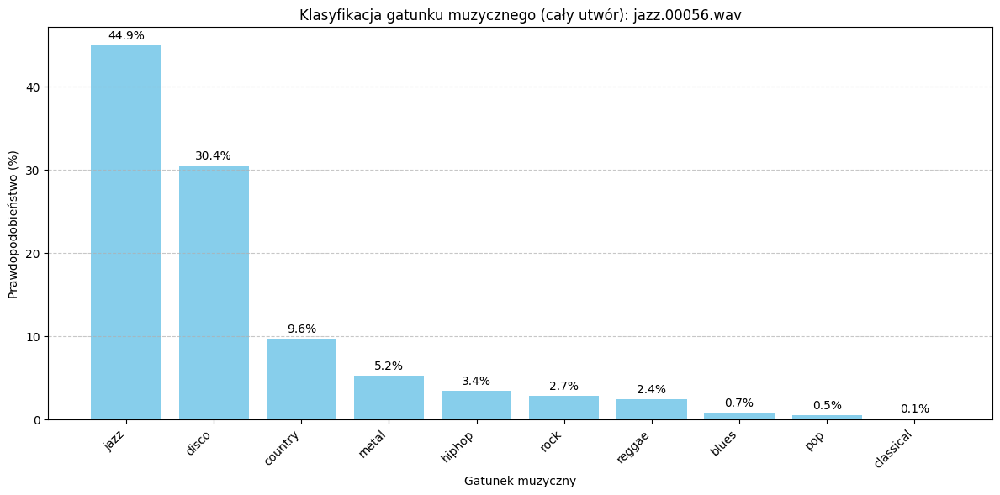


Wyniki klasyfikacji dla całego utworu: jazz.00056.wav
jazz           : 44.92%
disco          : 30.45%
country        : 9.63%
metal          : 5.18%
hiphop         : 3.39%
rock           : 2.75%
reggae         : 2.40%
blues          : 0.74%
pop            : 0.49%
classical      : 0.06%
Najwyższe prawdopodobieństwo: jazz (44.92%)


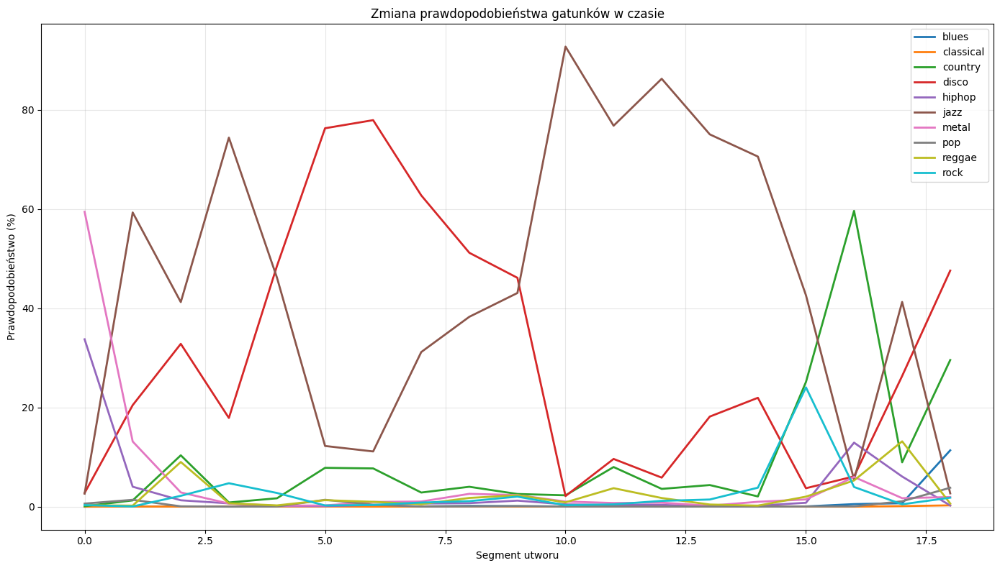

({'blues': 0.7357968964290769,
  'classical': 0.056347972024109606,
  'country': 9.630210936608675,
  'disco': 30.448491694895846,
  'hiphop': 3.3934485351078605,
  'jazz': 44.91777385732061,
  'metal': 5.181672057063368,
  'pop': 0.4884412218847214,
  'reggae': 2.398172783126172,
  'rock': 2.7496446784904323},
 [{'blues': 0.0035864421079168096,
   'classical': 0.010944964742520824,
   'country': 0.09669472929090261,
   'disco': 2.7654409408569336,
   'hiphop': 33.76246392726898,
   'jazz': 2.6344068348407745,
   'metal': 59.46539044380188,
   'pop': 0.6276661995798349,
   'reggae': 0.302433711476624,
   'rock': 0.3309690626338124},
  {'blues': 0.042633136035874486,
   'classical': 0.036044028820469975,
   'country': 1.2753870338201523,
   'disco': 20.480890572071075,
   'hiphop': 4.03314009308815,
   'jazz': 59.3305766582489,
   'metal': 13.146425783634186,
   'pop': 1.3934983871877193,
   'reggae': 0.2171928295865655,
   'rock': 0.04420753684826195},
  {'blues': 0.043975553126074374,

In [59]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/jazz/jazz.00056.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.01 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


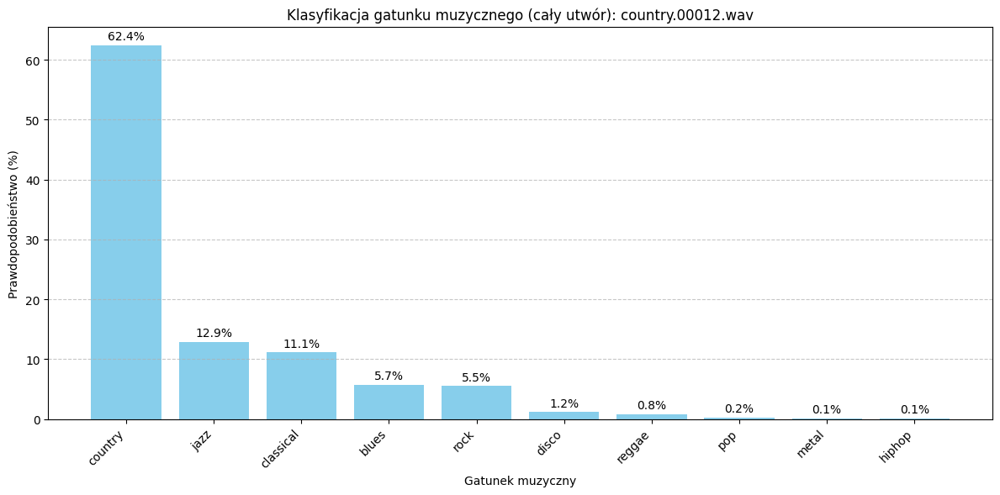


Wyniki klasyfikacji dla całego utworu: country.00012.wav
country        : 62.41%
jazz           : 12.90%
classical      : 11.11%
blues          : 5.69%
rock           : 5.48%
disco          : 1.18%
reggae         : 0.81%
pop            : 0.21%
metal          : 0.13%
hiphop         : 0.08%
Najwyższe prawdopodobieństwo: country (62.41%)


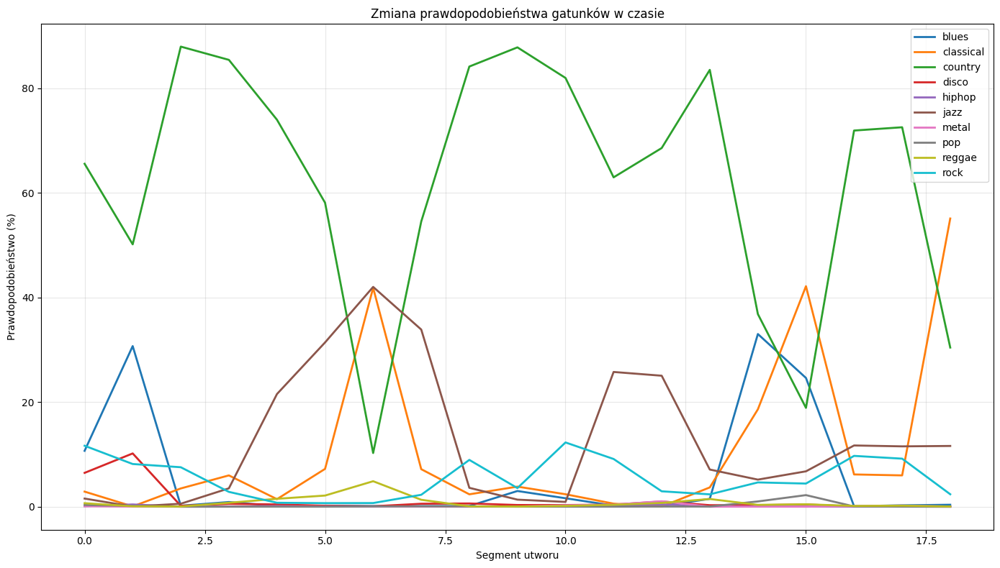

({'blues': 5.686056693268352,
  'classical': 11.108187043359258,
  'country': 62.40704577220114,
  'disco': 1.179354994306586,
  'hiphop': 0.08430761514127401,
  'jazz': 12.90108328332855,
  'metal': 0.1253721963860842,
  'pop': 0.2137953191107188,
  'reggae': 0.8103988962064154,
  'rock': 5.48439628542646},
 [{'blues': 10.684152692556381,
   'classical': 2.8850389644503593,
   'country': 65.56543707847595,
   'disco': 6.470255553722382,
   'hiphop': 0.10350557276979089,
   'jazz': 1.555029023438692,
   'metal': 0.0843064277432859,
   'pop': 0.3251550253480673,
   'reggae': 0.6731521338224411,
   'rock': 11.653970927000046},
  {'blues': 30.710935592651367,
   'classical': 0.05585353937931359,
   'country': 50.16393065452576,
   'disco': 10.187031328678131,
   'hiphop': 0.431771669536829,
   'jazz': 0.029771568370051682,
   'metal': 0.01751542731653899,
   'pop': 0.16571424202993512,
   'reggae': 0.07459879852831364,
   'rock': 8.162877708673477},
  {'blues': 0.18488422501832247,
   'cl

In [79]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/country/country.00012.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.01 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


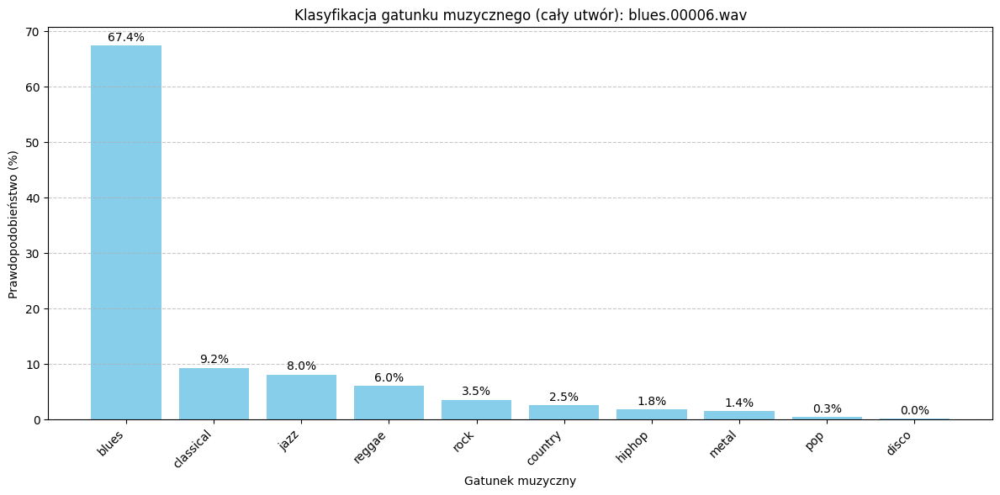


Wyniki klasyfikacji dla całego utworu: blues.00006.wav
blues          : 67.36%
classical      : 9.21%
jazz           : 8.02%
reggae         : 5.96%
rock           : 3.46%
country        : 2.50%
hiphop         : 1.76%
metal          : 1.37%
pop            : 0.34%
disco          : 0.02%
Najwyższe prawdopodobieństwo: blues (67.36%)


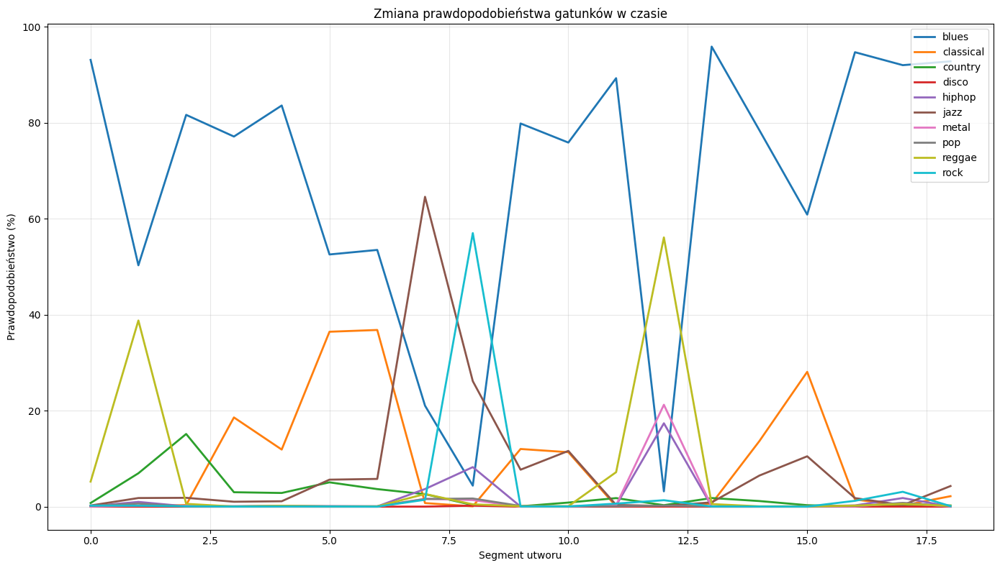

({'blues': 67.36145531268497,
  'classical': 9.20743457766213,
  'country': 2.500761463000488,
  'disco': 0.01902367551003025,
  'hiphop': 1.7622333464188207,
  'jazz': 8.019749067821785,
  'metal': 1.373103703640242,
  'pop': 0.3389398686857404,
  'reggae': 5.959059516164033,
  'rock': 3.4582403671887922},
 [{'blues': 93.07758212089539,
   'classical': 0.1368983183056116,
   'country': 0.7697729393839836,
   'disco': 0.0038834008591948077,
   'hiphop': 0.09677180205471814,
   'jazz': 0.2503312658518553,
   'metal': 0.02133641391992569,
   'pop': 0.18972383113577962,
   'reggae': 5.2275050431489944,
   'rock': 0.22618931252509356},
  {'blues': 50.29304623603821,
   'classical': 0.056495401076972485,
   'country': 6.964592635631561,
   'disco': 0.006874847167637199,
   'hiphop': 0.9974721819162369,
   'jazz': 1.8072331324219704,
   'metal': 0.22909545805305243,
   'pop': 0.6552212405949831,
   'reggae': 38.78328502178192,
   'rock': 0.206687836907804},
  {'blues': 81.62571787834167,
   

In [85]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/blues/blues.00006.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 30.00 sekund
Liczba segmentów do analizy: 19
Przeanalizowano segment 1/19 (0.0s - 3.0s)
Przeanalizowano segment 2/19 (1.5s - 4.5s)
Przeanalizowano segment 3/19 (3.0s - 6.0s)
Przeanalizowano segment 4/19 (4.5s - 7.5s)
Przeanalizowano segment 5/19 (6.0s - 9.0s)
Przeanalizowano segment 6/19 (7.5s - 10.5s)
Przeanalizowano segment 7/19 (9.0s - 12.0s)
Przeanalizowano segment 8/19 (10.5s - 13.5s)
Przeanalizowano segment 9/19 (12.0s - 15.0s)
Przeanalizowano segment 10/19 (13.5s - 16.5s)
Przeanalizowano segment 11/19 (15.0s - 18.0s)
Przeanalizowano segment 12/19 (16.5s - 19.5s)
Przeanalizowano segment 13/19 (18.0s - 21.0s)
Przeanalizowano segment 14/19 (19.5s - 22.5s)
Przeanalizowano segment 15/19 (21.0s - 24.0s)
Przeanalizowano segment 16/19 (22.5s - 25.5s)
Przeanalizowano segment 17/19 (24.0s - 27.0s)
Przeanalizowano segment 18/19 (25.5s - 28.5s)
Przeanalizowano segment 19/19 (27.0s - 30.0s)


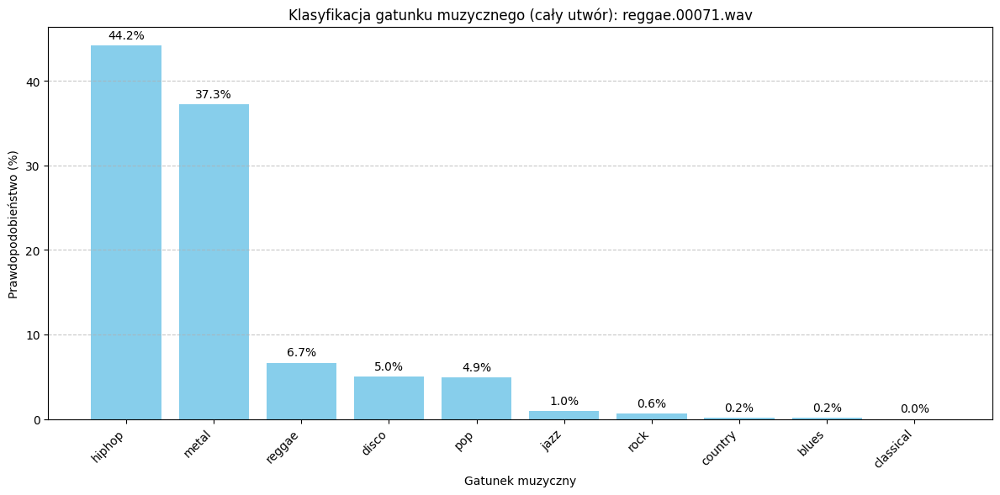


Wyniki klasyfikacji dla całego utworu: reggae.00071.wav
hiphop         : 44.20%
metal          : 37.27%
reggae         : 6.67%
disco          : 5.00%
pop            : 4.90%
jazz           : 0.99%
rock           : 0.61%
country        : 0.19%
blues          : 0.17%
classical      : 0.00%
Najwyższe prawdopodobieństwo: hiphop (44.20%)


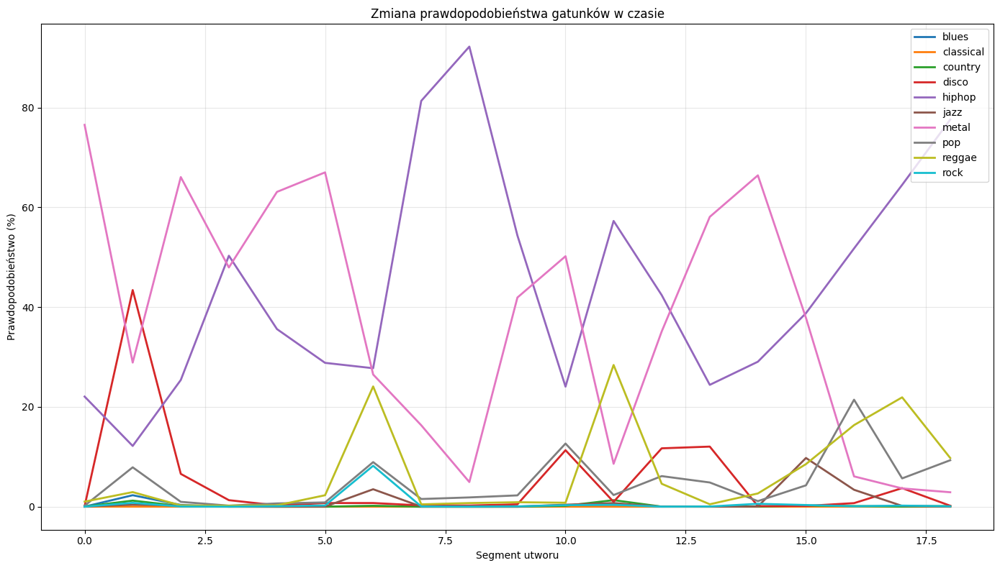

({'blues': 0.17061860343777593,
  'classical': 0.003079130599297442,
  'country': 0.19269698210624292,
  'disco': 5.0012293902814,
  'hiphop': 44.20255814727984,
  'jazz': 0.9856401572745342,
  'metal': 37.26724383274191,
  'pop': 4.9046500071295,
  'reggae': 6.665821888140942,
  'rock': 0.6064621730442205},
 [{'blues': 0.009596790914656594,
   'classical': 0.0009466907613386866,
   'country': 0.04015220620203763,
   'disco': 0.1041126437485218,
   'hiphop': 22.066886723041534,
   'jazz': 0.022953766165301204,
   'metal': 76.52587294578552,
   'pop': 0.20272957626730204,
   'reggae': 1.0166044346988201,
   'rock': 0.01014505178318359},
  {'blues': 2.2988270968198776,
   'classical': 0.012485007755458355,
   'country': 1.2172801420092583,
   'disco': 43.415746092796326,
   'hiphop': 12.175056338310242,
   'jazz': 0.4049282055348158,
   'metal': 28.887087106704712,
   'pop': 7.892535626888275,
   'reggae': 2.9243292286992073,
   'rock': 0.7717305328696966},
  {'blues': 0.3533859038725495

In [50]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Poboczne_projekty/Music_Genre_Classification_1/data/genres_original/reggae/reggae.00071.wav"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 280.11 sekund
Liczba segmentów do analizy: 185
Przeanalizowano segment 1/185 (0.0s - 3.0s)
Przeanalizowano segment 2/185 (1.5s - 4.5s)
Przeanalizowano segment 3/185 (3.0s - 6.0s)
Przeanalizowano segment 4/185 (4.5s - 7.5s)
Przeanalizowano segment 5/185 (6.0s - 9.0s)
Przeanalizowano segment 6/185 (7.5s - 10.5s)
Przeanalizowano segment 7/185 (9.0s - 12.0s)
Przeanalizowano segment 8/185 (10.5s - 13.5s)
Przeanalizowano segment 9/185 (12.0s - 15.0s)
Przeanalizowano segment 10/185 (13.5s - 16.5s)
Przeanalizowano segment 11/185 (15.0s - 18.0s)
Przeanalizowano segment 12/185 (16.5s - 19.5s)
Przeanalizowano segment 13/185 (18.0s - 21.0s)
Przeanalizowano segment 14/185 (19.5s - 22.5s)
Przeanalizowano segment 15/185 (21.0s - 24.0s)
Przeanalizowano segment 16/185 (22.5s - 25.5s)
Przeanalizowano segment 17/185 (24.0s - 27.0s)
Przeanalizowano segment 18/185 (25.5s - 28.5s)
Przeanalizowano segment 19/185 (27.0s - 30.0s)
P

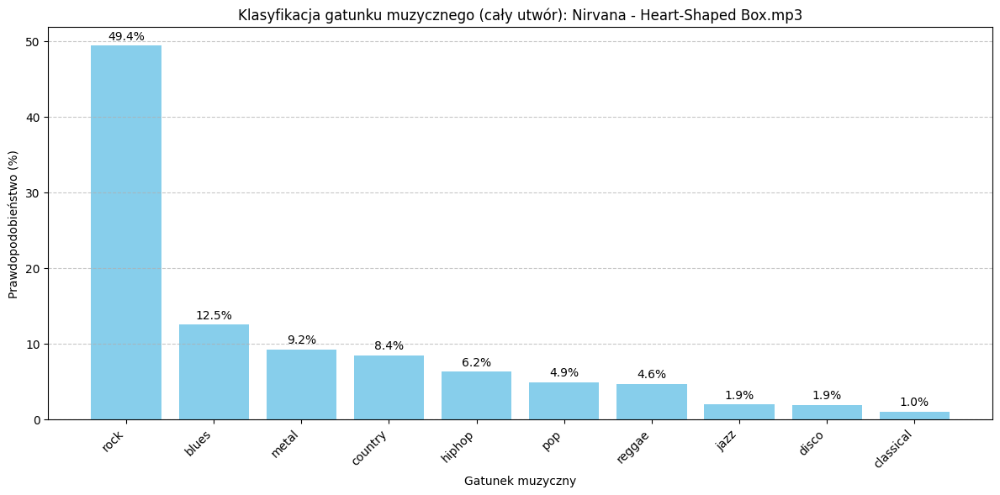


Wyniki klasyfikacji dla całego utworu: Nirvana - Heart-Shaped Box.mp3
rock           : 49.40%
blues          : 12.47%
metal          : 9.17%
country        : 8.41%
hiphop         : 6.23%
pop            : 4.89%
reggae         : 4.64%
jazz           : 1.91%
disco          : 1.89%
classical      : 1.00%
Najwyższe prawdopodobieństwo: rock (49.40%)


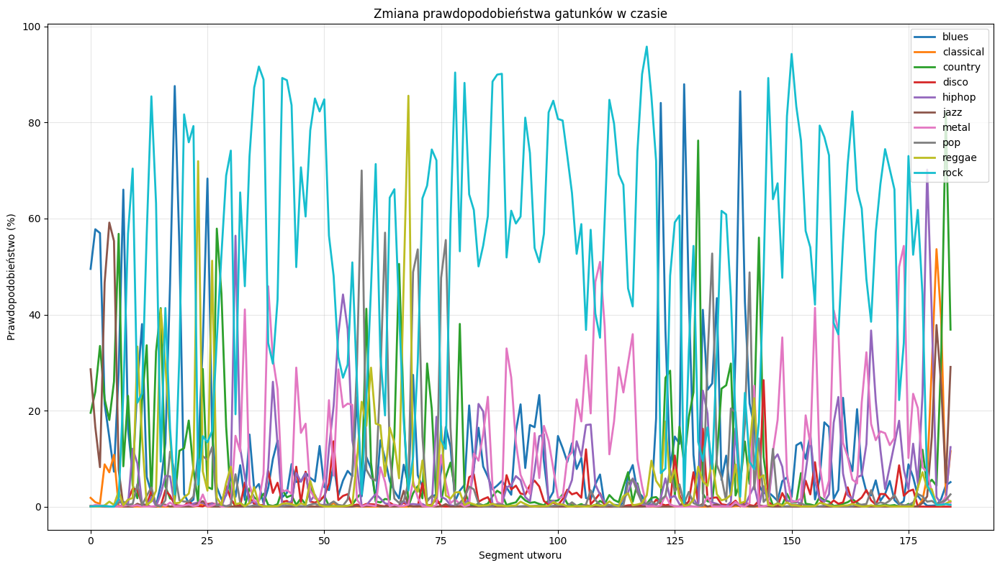

({'blues': 12.466098319273442,
  'classical': 1.0010463604059525,
  'country': 8.411936776498584,
  'disco': 1.8889565611302592,
  'hiphop': 6.228702675308907,
  'jazz': 1.9084176417620895,
  'metal': 9.174203795449325,
  'pop': 4.886075264441535,
  'reggae': 4.63571749448641,
  'rock': 49.39884493251746},
 [{'blues': 49.50690269470215,
   'classical': 1.8441485241055489,
   'country': 19.545485079288483,
   'disco': 0.14758360339328647,
   'hiphop': 0.11853112373501062,
   'jazz': 28.61366868019104,
   'metal': 0.05705786752514541,
   'pop': 0.008477684605168179,
   'reggae': 0.08766131941229105,
   'rock': 0.07048461702652276},
  {'blues': 57.76113271713257,
   'classical': 0.9337472729384899,
   'country': 23.903310298919678,
   'disco': 0.12060946319252253,
   'hiphop': 0.15769657911732793,
   'jazz': 16.587549448013306,
   'metal': 0.35297556314617395,
   'pop': 0.021796635701321065,
   'reggae': 0.041208957554772496,
   'rock': 0.11997433612123132},
  {'blues': 56.96918964385986,

In [51]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Nirvana - Heart-Shaped Box.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 353.61 sekund
Liczba segmentów do analizy: 234
Przeanalizowano segment 1/234 (0.0s - 3.0s)
Przeanalizowano segment 2/234 (1.5s - 4.5s)
Przeanalizowano segment 3/234 (3.0s - 6.0s)
Przeanalizowano segment 4/234 (4.5s - 7.5s)
Przeanalizowano segment 5/234 (6.0s - 9.0s)
Przeanalizowano segment 6/234 (7.5s - 10.5s)
Przeanalizowano segment 7/234 (9.0s - 12.0s)
Przeanalizowano segment 8/234 (10.5s - 13.5s)
Przeanalizowano segment 9/234 (12.0s - 15.0s)
Przeanalizowano segment 10/234 (13.5s - 16.5s)
Przeanalizowano segment 11/234 (15.0s - 18.0s)
Przeanalizowano segment 12/234 (16.5s - 19.5s)
Przeanalizowano segment 13/234 (18.0s - 21.0s)
Przeanalizowano segment 14/234 (19.5s - 22.5s)
Przeanalizowano segment 15/234 (21.0s - 24.0s)
Przeanalizowano segment 16/234 (22.5s - 25.5s)
Przeanalizowano segment 17/234 (24.0s - 27.0s)
Przeanalizowano segment 18/234 (25.5s - 28.5s)
Przeanalizowano segment 19/234 (27.0s - 30.0s)
P

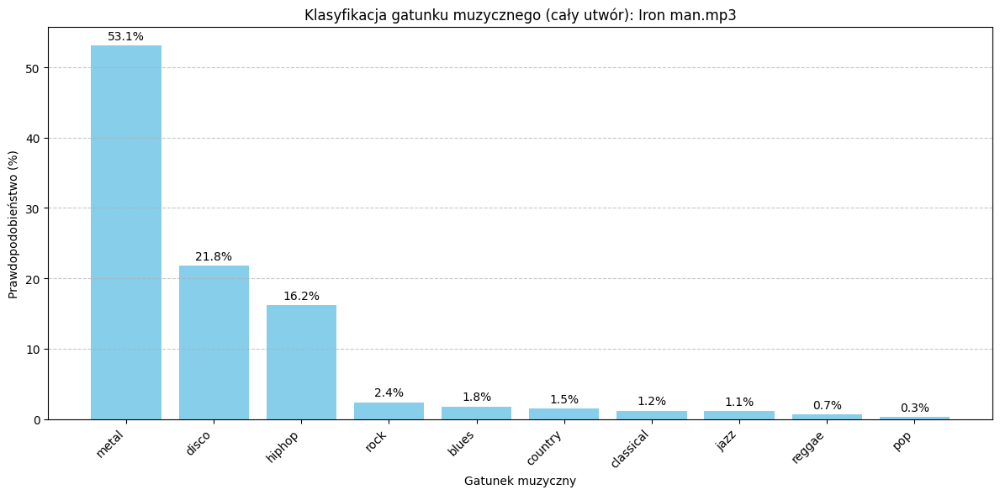


Wyniki klasyfikacji dla całego utworu: Iron man.mp3
metal          : 53.11%
disco          : 21.78%
hiphop         : 16.17%
rock           : 2.38%
blues          : 1.79%
country        : 1.51%
classical      : 1.19%
jazz           : 1.15%
reggae         : 0.66%
pop            : 0.26%
Najwyższe prawdopodobieństwo: metal (53.11%)


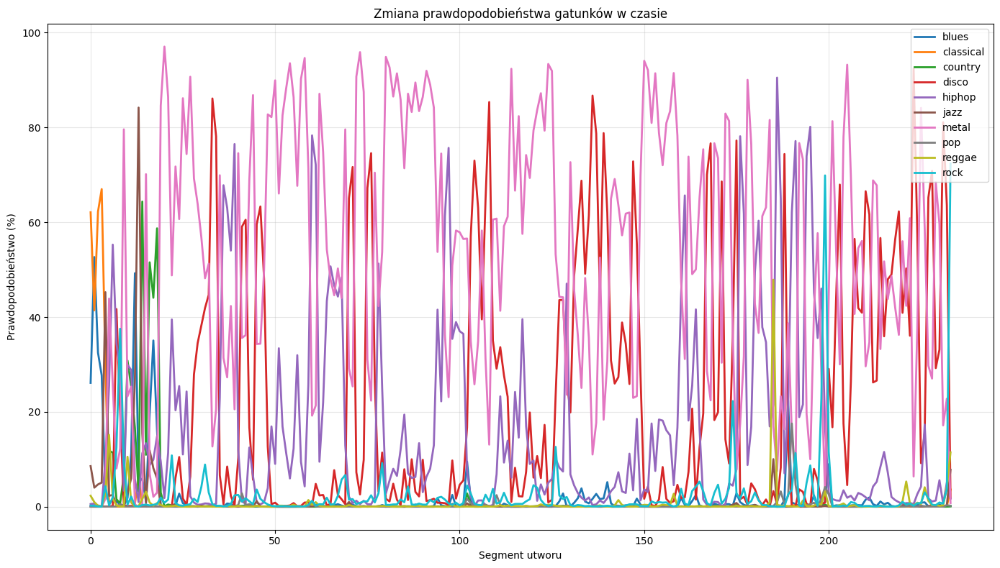

({'blues': 1.7875214745531711,
  'classical': 1.1869748280713128,
  'country': 1.5148526704051541,
  'disco': 21.782817798443403,
  'hiphop': 16.171095382400317,
  'jazz': 1.1468238372698478,
  'metal': 53.10872069916451,
  'pop': 0.2605594358657173,
  'reggae': 0.6569476715389427,
  'rock': 2.383686209021138},
 [{'blues': 26.120471954345703,
   'classical': 62.11639046669006,
   'country': 0.007488301343983039,
   'disco': 0.08367869886569679,
   'hiphop': 0.5524596199393272,
   'jazz': 8.560322225093842,
   'metal': 0.009195294114761055,
   'pop': 0.01068785713869147,
   'reggae': 2.3095399141311646,
   'rock': 0.22977583575993776},
  {'blues': 52.6685893535614,
   'classical': 41.42260551452637,
   'country': 0.005068218888482079,
   'disco': 0.025481931515969336,
   'hiphop': 0.6622811313718557,
   'jazz': 4.014969617128372,
   'metal': 0.011776951578212902,
   'pop': 0.007529869617428631,
   'reggae': 0.9768142364919186,
   'rock': 0.20487506408244371},
  {'blues': 32.485228776931

In [88]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Iron man.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 270.70 sekund
Liczba segmentów do analizy: 179
Przeanalizowano segment 1/179 (0.0s - 3.0s)
Przeanalizowano segment 2/179 (1.5s - 4.5s)
Przeanalizowano segment 3/179 (3.0s - 6.0s)
Przeanalizowano segment 4/179 (4.5s - 7.5s)
Przeanalizowano segment 5/179 (6.0s - 9.0s)
Przeanalizowano segment 6/179 (7.5s - 10.5s)
Przeanalizowano segment 7/179 (9.0s - 12.0s)
Przeanalizowano segment 8/179 (10.5s - 13.5s)
Przeanalizowano segment 9/179 (12.0s - 15.0s)
Przeanalizowano segment 10/179 (13.5s - 16.5s)
Przeanalizowano segment 11/179 (15.0s - 18.0s)
Przeanalizowano segment 12/179 (16.5s - 19.5s)
Przeanalizowano segment 13/179 (18.0s - 21.0s)
Przeanalizowano segment 14/179 (19.5s - 22.5s)
Przeanalizowano segment 15/179 (21.0s - 24.0s)
Przeanalizowano segment 16/179 (22.5s - 25.5s)
Przeanalizowano segment 17/179 (24.0s - 27.0s)
Przeanalizowano segment 18/179 (25.5s - 28.5s)
Przeanalizowano segment 19/179 (27.0s - 30.0s)
P

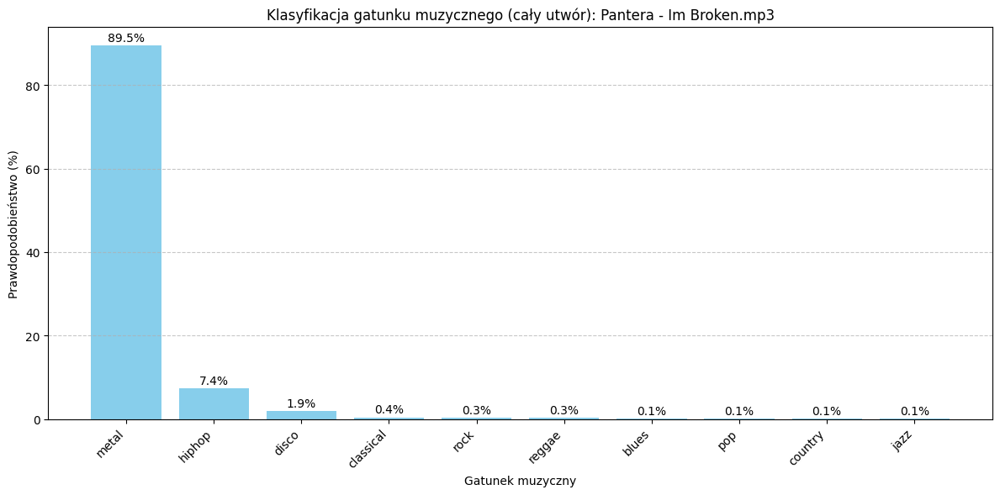


Wyniki klasyfikacji dla całego utworu: Pantera - Im Broken.mp3
metal          : 89.51%
hiphop         : 7.35%
disco          : 1.88%
classical      : 0.38%
rock           : 0.31%
reggae         : 0.29%
blues          : 0.08%
pop            : 0.08%
country        : 0.06%
jazz           : 0.05%
Najwyższe prawdopodobieństwo: metal (89.51%)


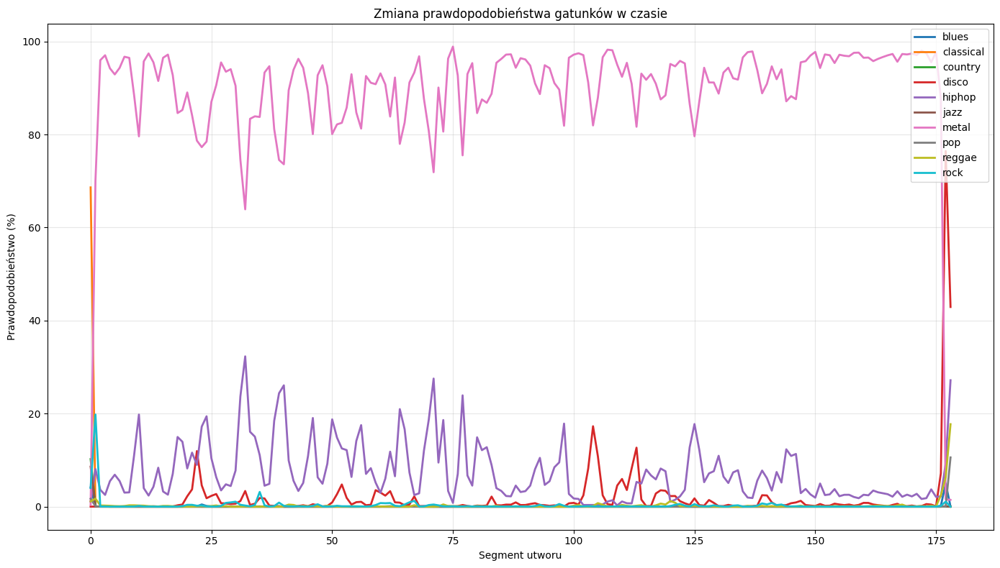

({'blues': 0.08208630329415667,
  'classical': 0.38490188515421153,
  'country': 0.06139814340827523,
  'disco': 1.8762983634089792,
  'hiphop': 7.3532951631526045,
  'jazz': 0.05353555218823849,
  'metal': 89.51299004308754,
  'pop': 0.07775738420969754,
  'reggae': 0.2866420297348607,
  'rock': 0.31109508698075805},
 [{'blues': 4.132850468158722,
   'classical': 68.62598061561584,
   'country': 10.224547237157822,
   'disco': 0.01034569286275655,
   'hiphop': 1.0988106951117516,
   'jazz': 8.604210615158081,
   'metal': 0.4252777434885502,
   'pop': 1.7145486548542976,
   'reggae': 1.1390775442123413,
   'rock': 4.02434729039669},
  {'blues': 0.061459949938580394,
   'classical': 0.00833927551866509,
   'country': 0.04659003461711109,
   'disco': 0.013268273323774338,
   'hiphop': 8.080556988716125,
   'jazz': 0.01033064181683585,
   'metal': 70.10330557823181,
   'pop': 0.12576731387525797,
   'reggae': 1.7349539324641228,
   'rock': 19.81542706489563},
  {'blues': 0.032055203337222

In [89]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Pantera - Im Broken.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 371.23 sekund
Liczba segmentów do analizy: 246
Przeanalizowano segment 1/246 (0.0s - 3.0s)
Przeanalizowano segment 2/246 (1.5s - 4.5s)
Przeanalizowano segment 3/246 (3.0s - 6.0s)
Przeanalizowano segment 4/246 (4.5s - 7.5s)
Przeanalizowano segment 5/246 (6.0s - 9.0s)
Przeanalizowano segment 6/246 (7.5s - 10.5s)
Przeanalizowano segment 7/246 (9.0s - 12.0s)
Przeanalizowano segment 8/246 (10.5s - 13.5s)
Przeanalizowano segment 9/246 (12.0s - 15.0s)
Przeanalizowano segment 10/246 (13.5s - 16.5s)
Przeanalizowano segment 11/246 (15.0s - 18.0s)
Przeanalizowano segment 12/246 (16.5s - 19.5s)
Przeanalizowano segment 13/246 (18.0s - 21.0s)
Przeanalizowano segment 14/246 (19.5s - 22.5s)
Przeanalizowano segment 15/246 (21.0s - 24.0s)
Przeanalizowano segment 16/246 (22.5s - 25.5s)
Przeanalizowano segment 17/246 (24.0s - 27.0s)
Przeanalizowano segment 18/246 (25.5s - 28.5s)
Przeanalizowano segment 19/246 (27.0s - 30.0s)
P

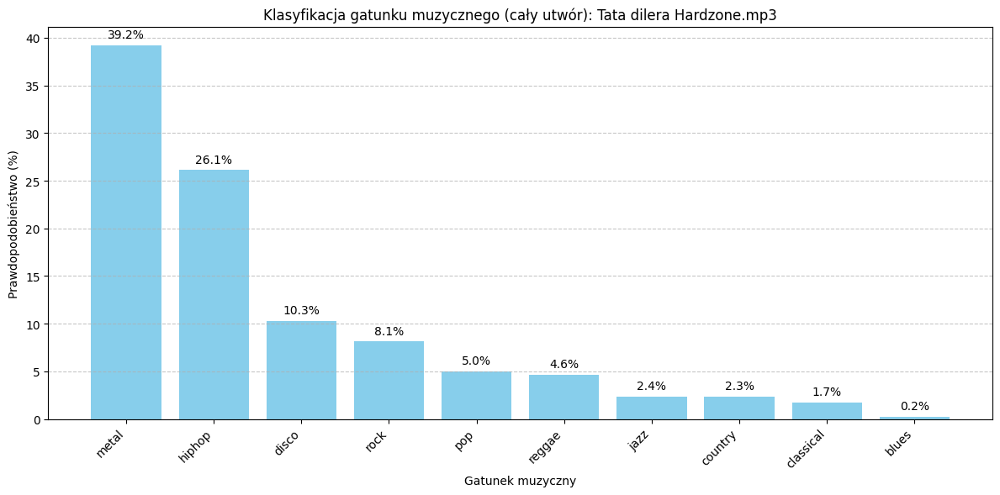


Wyniki klasyfikacji dla całego utworu: Tata dilera Hardzone.mp3
metal          : 39.19%
hiphop         : 26.11%
disco          : 10.28%
rock           : 8.12%
pop            : 5.00%
reggae         : 4.62%
jazz           : 2.38%
country        : 2.34%
classical      : 1.72%
blues          : 0.23%
Najwyższe prawdopodobieństwo: metal (39.19%)


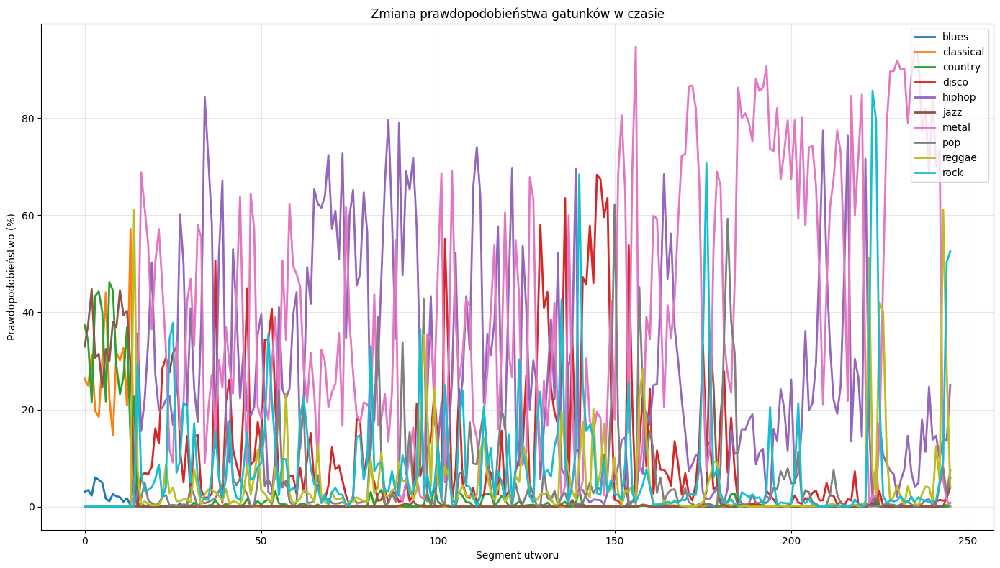

({'blues': 0.23191719316108775,
  'classical': 1.720950361806633,
  'country': 2.3397788766179084,
  'disco': 10.28096167305844,
  'hiphop': 26.11140244464959,
  'jazz': 2.3834425035171463,
  'metal': 39.19052475565234,
  'pop': 4.996342034039442,
  'reggae': 4.6219596375773495,
  'rock': 8.122720220534376},
 [{'blues': 3.065316565334797,
   'classical': 26.353466510772705,
   'country': 37.403783202171326,
   'disco': 0.05047144368290901,
   'hiphop': 0.04888534313067794,
   'jazz': 32.97185003757477,
   'metal': 0.02076512755593285,
   'pop': 0.01637734385440126,
   'reggae': 0.05664367927238345,
   'rock': 0.012438616249710321},
  {'blues': 3.4229546785354614,
   'classical': 24.913613498210907,
   'country': 33.949193358421326,
   'disco': 0.05997296539135277,
   'hiphop': 0.04566740244626999,
   'jazz': 37.514129281044006,
   'metal': 0.021067804482299834,
   'pop': 0.009477166167926043,
   'reggae': 0.053013552678748965,
   'rock': 0.010913928417721763},
  {'blues': 2.28465013206

In [54]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Tata dilera Hardzone.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 269.26 sekund
Liczba segmentów do analizy: 178
Przeanalizowano segment 1/178 (0.0s - 3.0s)
Przeanalizowano segment 2/178 (1.5s - 4.5s)
Przeanalizowano segment 3/178 (3.0s - 6.0s)
Przeanalizowano segment 4/178 (4.5s - 7.5s)
Przeanalizowano segment 5/178 (6.0s - 9.0s)
Przeanalizowano segment 6/178 (7.5s - 10.5s)
Przeanalizowano segment 7/178 (9.0s - 12.0s)
Przeanalizowano segment 8/178 (10.5s - 13.5s)
Przeanalizowano segment 9/178 (12.0s - 15.0s)
Przeanalizowano segment 10/178 (13.5s - 16.5s)
Przeanalizowano segment 11/178 (15.0s - 18.0s)
Przeanalizowano segment 12/178 (16.5s - 19.5s)
Przeanalizowano segment 13/178 (18.0s - 21.0s)
Przeanalizowano segment 14/178 (19.5s - 22.5s)
Przeanalizowano segment 15/178 (21.0s - 24.0s)
Przeanalizowano segment 16/178 (22.5s - 25.5s)
Przeanalizowano segment 17/178 (24.0s - 27.0s)
Przeanalizowano segment 18/178 (25.5s - 28.5s)
Przeanalizowano segment 19/178 (27.0s - 30.0s)
P

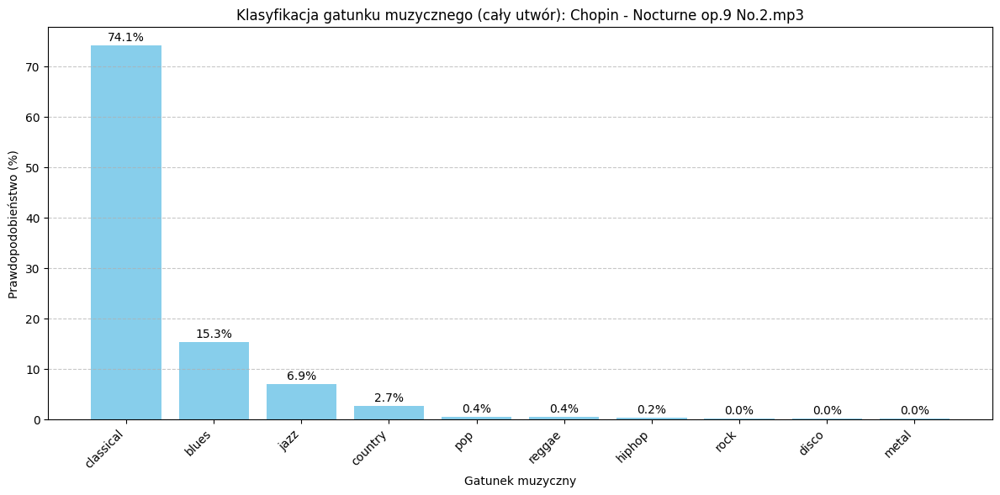


Wyniki klasyfikacji dla całego utworu: Chopin - Nocturne op.9 No.2.mp3
classical      : 74.09%
blues          : 15.33%
jazz           : 6.85%
country        : 2.67%
pop            : 0.40%
reggae         : 0.37%
hiphop         : 0.19%
rock           : 0.05%
disco          : 0.03%
metal          : 0.02%
Najwyższe prawdopodobieństwo: classical (74.09%)


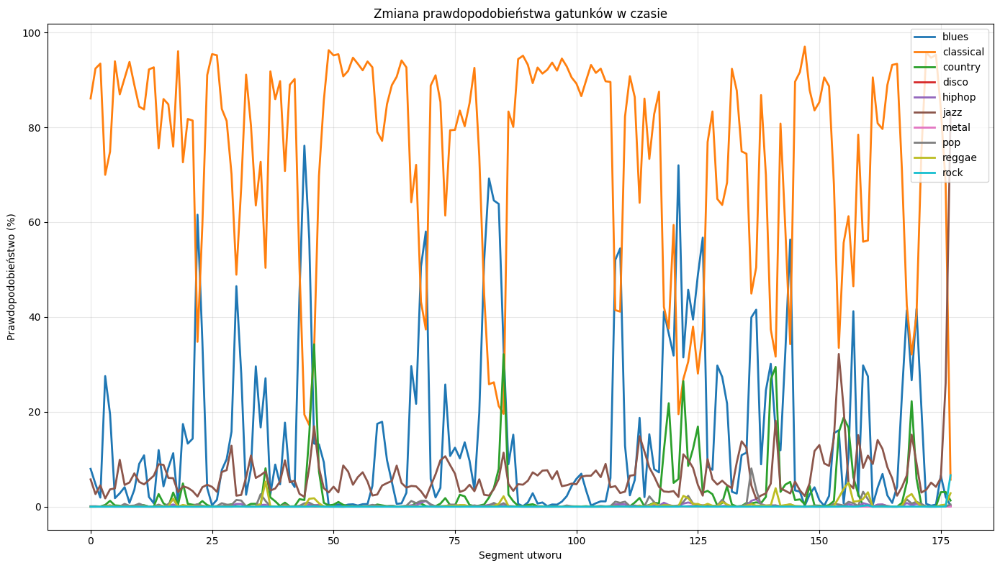

({'blues': 15.331518420494382,
  'classical': 74.088487799248,
  'country': 2.6689092403552768,
  'disco': 0.02821161902891086,
  'hiphop': 0.19061407360669783,
  'jazz': 6.853440332781063,
  'metal': 0.019812425971062867,
  'pop': 0.4026904453414236,
  'reggae': 0.3670433797830473,
  'rock': 0.04927189851376456},
 [{'blues': 7.975750416517258,
   'classical': 86.0762357711792,
   'country': 0.006242847302928567,
   'disco': 0.0521632086019963,
   'hiphop': 0.0988262239843607,
   'jazz': 5.759778991341591,
   'metal': 0.004475283276406117,
   'pop': 0.01823445491027087,
   'reggae': 0.005208453876548447,
   'rock': 0.003068902515224181},
  {'blues': 4.7720737755298615,
   'classical': 92.38990545272827,
   'country': 0.005578663694905117,
   'disco': 0.0163582299137488,
   'hiphop': 0.1061145099811256,
   'jazz': 2.6517707854509354,
   'metal': 0.0077176904596854,
   'pop': 0.04307884082663804,
   'reggae': 0.004475666719372384,
   'rock': 0.002934883741545491},
  {'blues': 1.923171058

In [55]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Chopin - Nocturne op.9 No.2.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 181.55 sekund
Liczba segmentów do analizy: 120
Przeanalizowano segment 1/120 (0.0s - 3.0s)
Przeanalizowano segment 2/120 (1.5s - 4.5s)
Przeanalizowano segment 3/120 (3.0s - 6.0s)
Przeanalizowano segment 4/120 (4.5s - 7.5s)
Przeanalizowano segment 5/120 (6.0s - 9.0s)
Przeanalizowano segment 6/120 (7.5s - 10.5s)
Przeanalizowano segment 7/120 (9.0s - 12.0s)
Przeanalizowano segment 8/120 (10.5s - 13.5s)
Przeanalizowano segment 9/120 (12.0s - 15.0s)
Przeanalizowano segment 10/120 (13.5s - 16.5s)
Przeanalizowano segment 11/120 (15.0s - 18.0s)
Przeanalizowano segment 12/120 (16.5s - 19.5s)
Przeanalizowano segment 13/120 (18.0s - 21.0s)
Przeanalizowano segment 14/120 (19.5s - 22.5s)
Przeanalizowano segment 15/120 (21.0s - 24.0s)
Przeanalizowano segment 16/120 (22.5s - 25.5s)
Przeanalizowano segment 17/120 (24.0s - 27.0s)
Przeanalizowano segment 18/120 (25.5s - 28.5s)
Przeanalizowano segment 19/120 (27.0s - 30.0s)
P

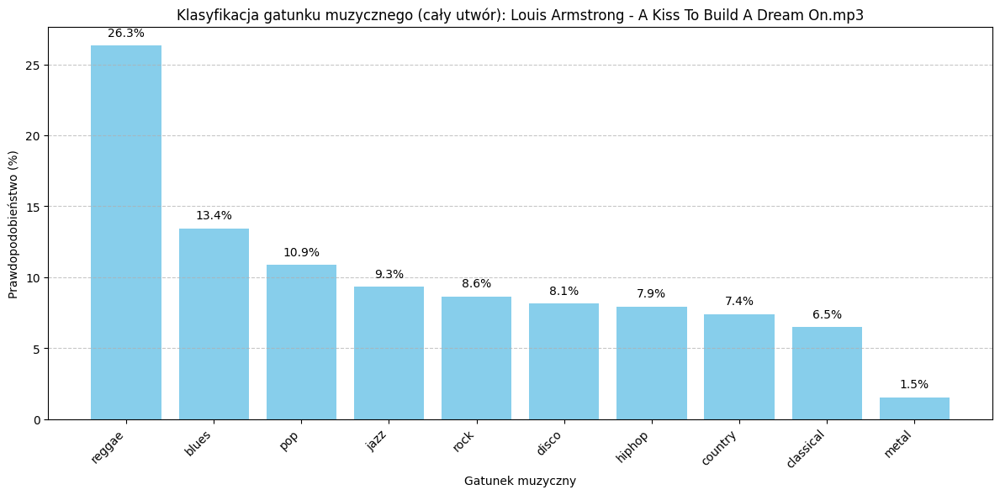


Wyniki klasyfikacji dla całego utworu: Louis Armstrong - A Kiss To Build A Dream On.mp3
reggae         : 26.33%
blues          : 13.42%
pop            : 10.87%
jazz           : 9.31%
rock           : 8.63%
disco          : 8.12%
hiphop         : 7.93%
country        : 7.39%
classical      : 6.47%
metal          : 1.52%
Najwyższe prawdopodobieństwo: reggae (26.33%)


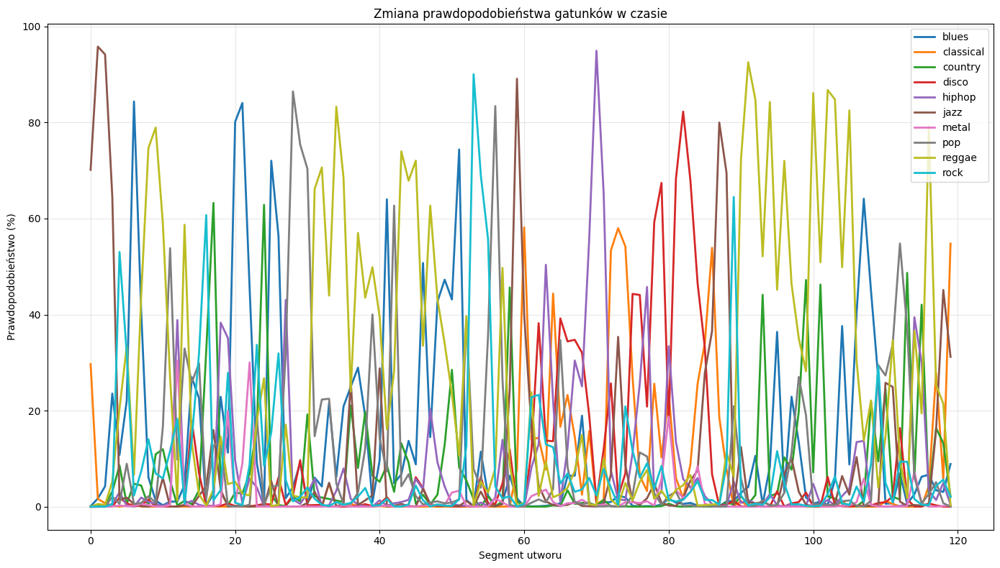

({'blues': 13.42448527958671,
  'classical': 6.471944676630604,
  'country': 7.3886550958195585,
  'disco': 8.119185040866341,
  'hiphop': 7.93184019413123,
  'jazz': 9.309334144842675,
  'metal': 1.519244002946607,
  'pop': 10.869124858680456,
  'reggae': 26.33218491027492,
  'rock': 8.634001769214592},
 [{'blues': 0.07660032133571804,
   'classical': 29.688572883605957,
   'country': 0.08651381358504295,
   'disco': 0.0009651744221628178,
   'hiphop': 0.0026925730708171614,
   'jazz': 70.13238072395325,
   'metal': 0.000547158333574771,
   'pop': 0.004524214455159381,
   'reggae': 0.0024061353542492725,
   'rock': 0.004783611439052038},
  {'blues': 1.7256412655115128,
   'classical': 1.6292296350002289,
   'country': 0.2511054975911975,
   'disco': 0.0017275617210543714,
   'hiphop': 0.019575997430365533,
   'jazz': 95.78651785850525,
   'metal': 0.0015194787010841537,
   'pop': 0.002642293657117989,
   'reggae': 0.5523049272596836,
   'rock': 0.029723928309977055},
  {'blues': 4.232

In [90]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Louis Armstrong - A Kiss To Build A Dream On.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 190.09 sekund
Liczba segmentów do analizy: 125
Przeanalizowano segment 1/125 (0.0s - 3.0s)
Przeanalizowano segment 2/125 (1.5s - 4.5s)
Przeanalizowano segment 3/125 (3.0s - 6.0s)
Przeanalizowano segment 4/125 (4.5s - 7.5s)
Przeanalizowano segment 5/125 (6.0s - 9.0s)
Przeanalizowano segment 6/125 (7.5s - 10.5s)
Przeanalizowano segment 7/125 (9.0s - 12.0s)
Przeanalizowano segment 8/125 (10.5s - 13.5s)
Przeanalizowano segment 9/125 (12.0s - 15.0s)
Przeanalizowano segment 10/125 (13.5s - 16.5s)
Przeanalizowano segment 11/125 (15.0s - 18.0s)
Przeanalizowano segment 12/125 (16.5s - 19.5s)
Przeanalizowano segment 13/125 (18.0s - 21.0s)
Przeanalizowano segment 14/125 (19.5s - 22.5s)
Przeanalizowano segment 15/125 (21.0s - 24.0s)
Przeanalizowano segment 16/125 (22.5s - 25.5s)
Przeanalizowano segment 17/125 (24.0s - 27.0s)
Przeanalizowano segment 18/125 (25.5s - 28.5s)
Przeanalizowano segment 19/125 (27.0s - 30.0s)
P

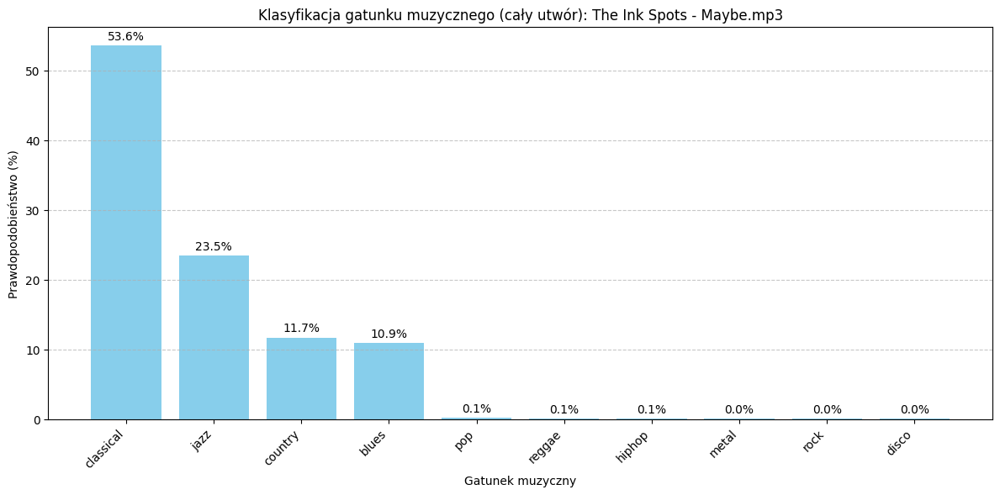


Wyniki klasyfikacji dla całego utworu: The Ink Spots - Maybe.mp3
classical      : 53.58%
jazz           : 23.45%
country        : 11.69%
blues          : 10.95%
pop            : 0.15%
reggae         : 0.06%
hiphop         : 0.06%
metal          : 0.04%
rock           : 0.02%
disco          : 0.01%
Najwyższe prawdopodobieństwo: classical (53.58%)


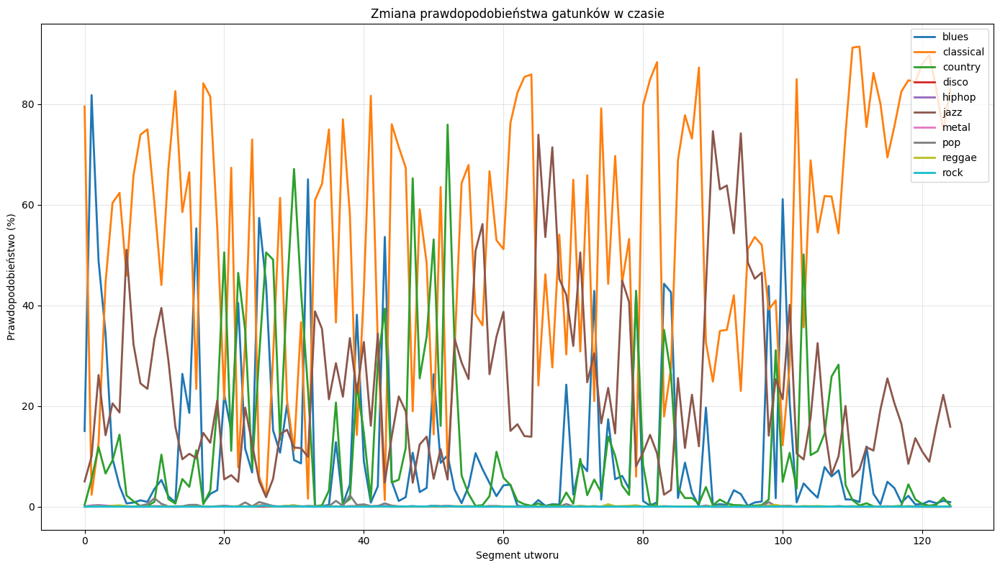

({'blues': 10.948412556992844,
  'classical': 53.57800433933735,
  'country': 11.692493578631547,
  'disco': 0.012470992519229184,
  'hiphop': 0.056556225291569714,
  'jazz': 23.454177813231944,
  'metal': 0.035325873193505684,
  'pop': 0.14798750289774035,
  'reggae': 0.05872376350816921,
  'rock': 0.015847754970673124},
 [{'blues': 15.0357186794281,
   'classical': 79.49599623680115,
   'country': 0.34169855061918497,
   'disco': 0.01706064213067293,
   'hiphop': 0.06495969137176871,
   'jazz': 5.021151900291443,
   'metal': 0.006196222238941118,
   'pop': 0.0100182973255869,
   'reggae': 0.0035089342418359593,
   'rock': 0.0036928402550984174},
  {'blues': 81.7538321018219,
   'classical': 2.3678939789533615,
   'country': 5.514029413461685,
   'disco': 0.056391634279862046,
   'hiphop': 0.23631732910871506,
   'jazz': 9.97566357254982,
   'metal': 0.018990086391568184,
   'pop': 0.003824299346888438,
   'reggae': 0.0629233371000737,
   'rock': 0.010135283810086548},
  {'blues': 48.

In [91]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/The Ink Spots - Maybe.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 272.38 sekund
Liczba segmentów do analizy: 180
Przeanalizowano segment 1/180 (0.0s - 3.0s)
Przeanalizowano segment 2/180 (1.5s - 4.5s)
Przeanalizowano segment 3/180 (3.0s - 6.0s)
Przeanalizowano segment 4/180 (4.5s - 7.5s)
Przeanalizowano segment 5/180 (6.0s - 9.0s)
Przeanalizowano segment 6/180 (7.5s - 10.5s)
Przeanalizowano segment 7/180 (9.0s - 12.0s)
Przeanalizowano segment 8/180 (10.5s - 13.5s)
Przeanalizowano segment 9/180 (12.0s - 15.0s)
Przeanalizowano segment 10/180 (13.5s - 16.5s)
Przeanalizowano segment 11/180 (15.0s - 18.0s)
Przeanalizowano segment 12/180 (16.5s - 19.5s)
Przeanalizowano segment 13/180 (18.0s - 21.0s)
Przeanalizowano segment 14/180 (19.5s - 22.5s)
Przeanalizowano segment 15/180 (21.0s - 24.0s)
Przeanalizowano segment 16/180 (22.5s - 25.5s)
Przeanalizowano segment 17/180 (24.0s - 27.0s)
Przeanalizowano segment 18/180 (25.5s - 28.5s)
Przeanalizowano segment 19/180 (27.0s - 30.0s)
P

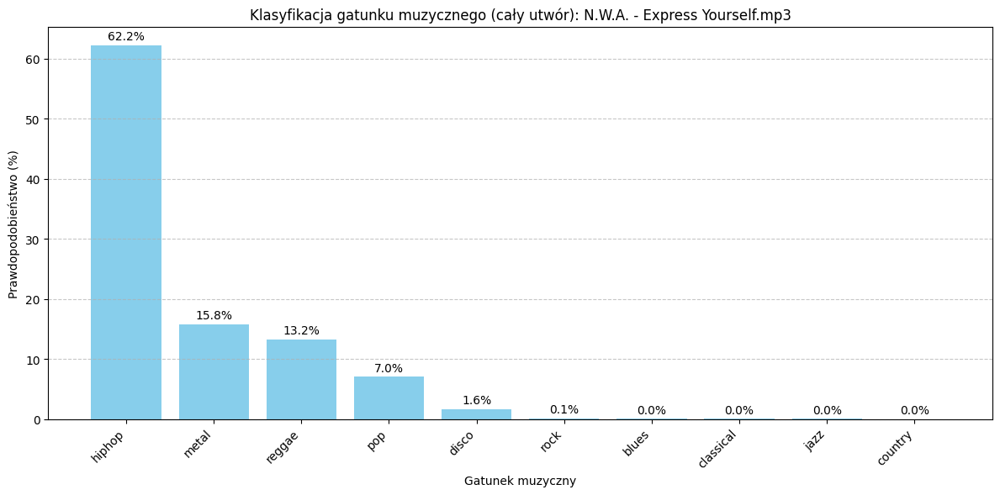


Wyniki klasyfikacji dla całego utworu: N.W.A. - Express Yourself.mp3
hiphop         : 62.17%
metal          : 15.80%
reggae         : 13.23%
pop            : 7.03%
disco          : 1.65%
rock           : 0.08%
blues          : 0.02%
classical      : 0.01%
jazz           : 0.01%
country        : 0.00%
Najwyższe prawdopodobieństwo: hiphop (62.17%)


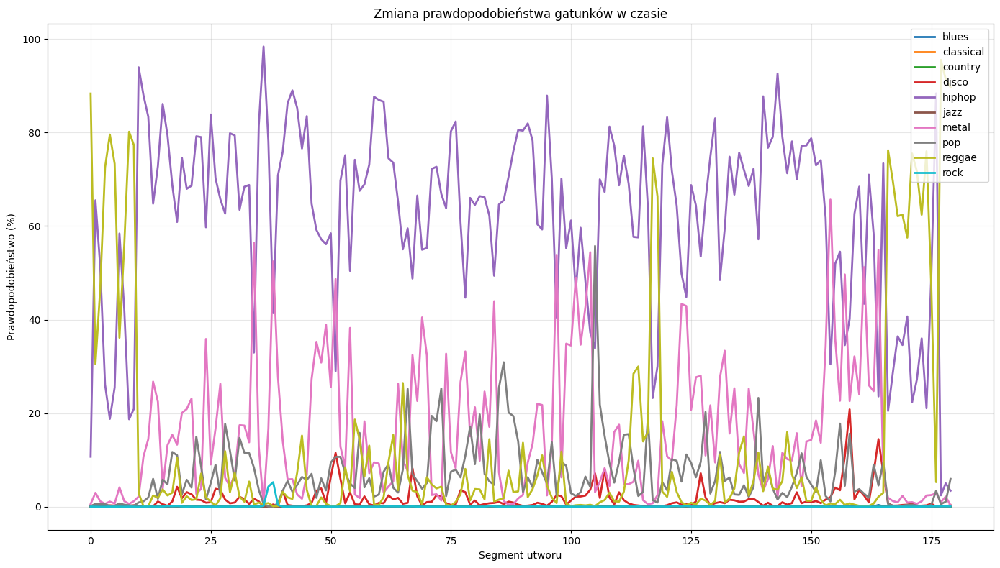

({'blues': 0.024167908645217215,
  'classical': 0.006936919257138167,
  'country': 0.0011704162403071274,
  'disco': 1.6483857706205325,
  'hiphop': 62.17402362057732,
  'jazz': 0.0068805097511257275,
  'metal': 15.799512459715414,
  'pop': 7.028507535239139,
  'reggae': 13.232123375799144,
  'rock': 0.07829125541926867},
 [{'blues': 0.06956331199035048,
   'classical': 0.029774027643725276,
   'country': 0.0003801821776505676,
   'disco': 0.2155578462406993,
   'hiphop': 10.682570934295654,
   'jazz': 0.015878140402492136,
   'metal': 0.5695659201592207,
   'pop': 0.06762595730833709,
   'reggae': 88.33573460578918,
   'rock': 0.013341018348000944},
  {'blues': 0.02948443579953164,
   'classical': 0.018067428027279675,
   'country': 0.0002722847057157196,
   'disco': 0.33910225611180067,
   'hiphop': 65.51013588905334,
   'jazz': 0.01977830979740247,
   'metal': 2.977093867957592,
   'pop': 0.6212625652551651,
   'reggae': 30.462226271629333,
   'rock': 0.02257407904835418},
  {'blues

In [92]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/N.W.A. - Express Yourself.mp3"
analyze_full_song(audio_path)

Używane urządzenie: cuda:0
Model załadowany pomyślnie!
Wczytano utwór, długość: 162.26 sekund
Liczba segmentów do analizy: 107
Przeanalizowano segment 1/107 (0.0s - 3.0s)
Przeanalizowano segment 2/107 (1.5s - 4.5s)
Przeanalizowano segment 3/107 (3.0s - 6.0s)
Przeanalizowano segment 4/107 (4.5s - 7.5s)
Przeanalizowano segment 5/107 (6.0s - 9.0s)
Przeanalizowano segment 6/107 (7.5s - 10.5s)
Przeanalizowano segment 7/107 (9.0s - 12.0s)
Przeanalizowano segment 8/107 (10.5s - 13.5s)
Przeanalizowano segment 9/107 (12.0s - 15.0s)
Przeanalizowano segment 10/107 (13.5s - 16.5s)
Przeanalizowano segment 11/107 (15.0s - 18.0s)
Przeanalizowano segment 12/107 (16.5s - 19.5s)
Przeanalizowano segment 13/107 (18.0s - 21.0s)
Przeanalizowano segment 14/107 (19.5s - 22.5s)
Przeanalizowano segment 15/107 (21.0s - 24.0s)
Przeanalizowano segment 16/107 (22.5s - 25.5s)
Przeanalizowano segment 17/107 (24.0s - 27.0s)
Przeanalizowano segment 18/107 (25.5s - 28.5s)
Przeanalizowano segment 19/107 (27.0s - 30.0s)
P

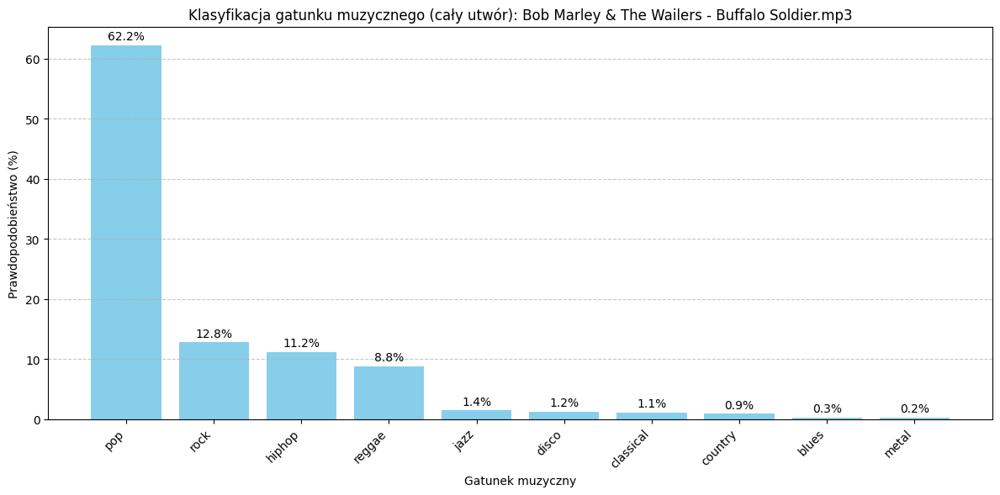


Wyniki klasyfikacji dla całego utworu: Bob Marley & The Wailers - Buffalo Soldier.mp3
pop            : 62.21%
rock           : 12.79%
hiphop         : 11.17%
reggae         : 8.76%
jazz           : 1.45%
disco          : 1.21%
classical      : 1.06%
country        : 0.88%
blues          : 0.26%
metal          : 0.21%
Najwyższe prawdopodobieństwo: pop (62.21%)


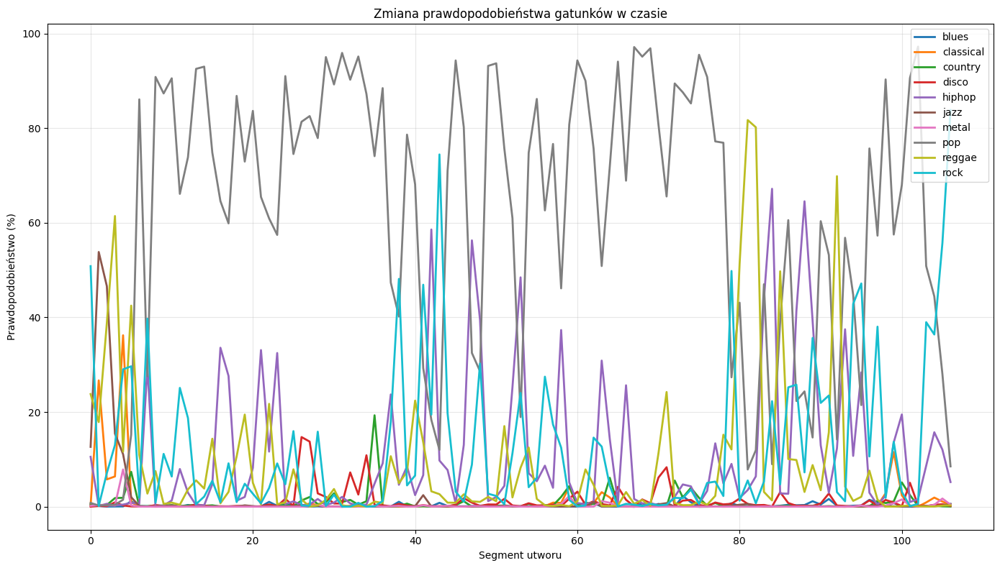

({'blues': 0.2563253050343562,
  'classical': 1.0647116910719132,
  'country': 0.8791937995712908,
  'disco': 1.2058723311358301,
  'hiphop': 11.174748817847162,
  'jazz': 1.445396766586068,
  'metal': 0.21437987942692552,
  'pop': 62.209846848996236,
  'reggae': 8.759071004767923,
  'rock': 12.790453329903485},
 [{'blues': 0.6081342231482267,
   'classical': 0.2760946284979582,
   'country': 0.30843850690871477,
   'disco': 0.008370390423806384,
   'hiphop': 10.53728237748146,
   'jazz': 12.64401376247406,
   'metal': 0.1874551293440163,
   'pop': 0.7965548895299435,
   'reggae': 23.797614872455597,
   'rock': 50.83604454994202},
  {'blues': 0.1718127983622253,
   'classical': 26.692381501197815,
   'country': 0.3709440119564533,
   'disco': 0.1567438361234963,
   'hiphop': 0.1548492582514882,
   'jazz': 53.83193492889404,
   'metal': 0.3413114696741104,
   'pop': 0.24769857991486788,
   'reggae': 17.876538634300232,
   'rock': 0.15578486490994692},
  {'blues': 0.028093770379200578,
 

In [93]:
# Przykład użycia
audio_path = "C:/Users/artur/Desktop/Studia/Seminaria/Przykładowa muzyka/Bob Marley & The Wailers - Buffalo Soldier.mp3"
analyze_full_song(audio_path)